<div class='alert alert-info'>
    <h1>AquaCrop-OSPy - 04 - Recaibrated Model</h1><br>
    by: <b>Babak Zolghadr-Asli</b>
    
   [Github](https://github.com/BabakZolghadrAsli)
   [oricID](https://orcid.org/0000-0002-3392-2672)
   [Google Scholar](https://scholar.google.com/citations?user=6owBze4AAAAJ&hl=en)
   [LinedIn](https://www.linkedin.com/in/babak-zolghadr-asli/)
   [Scopus](https://www.scopus.com/authid/detail.uri?authorId=57189713834)
   [Personal Website](https://babakzolghadrasli.space/)
 
</div>

<div class='alert alert-warning'>
    <h2>Environment Setup</i></h2>
</div>

In [1]:
import os
os.environ['DEVELOPMENT'] = 'DEVELOPMENT'

import warnings
warnings.simplefilter(action='ignore')
# warnings.simplefilter(action='ignore', category=FutureWarning)

In [2]:
import aquacrop
from aquacrop import AquaCropModel, Soil, Crop, InitialWaterContent, FieldMngt, GroundWater, IrrigationManagement, CO2
from aquacrop.utils import prepare_weather, get_filepath, prepare_lars_weather,select_lars_wdf

import time
from pathlib import Path
from tqdm.autonotebook import tqdm
import numpy as np
import pandas as pd
import matplotlib
import scipy
import scipy.stats as stats
import statsmodels.api as sm

from adjustText import adjust_text

import matplotlib.pyplot as plt
import seaborn as sns

INFO:root:Running the simulation in development mode.


<div class='alert alert-warning'>
    <h2>Function Definitions</i></h2>
</div>

In [3]:
# Tested
################### WEATHER DATA VISUALIZATION ###################

def plot_weather_data(weather_df, dpi=100, save_file=False):
    fig, ax = plt.subplots(3, 1, figsize=(12, 6), dpi=dpi, sharex=True)
    
    weather_df['MinTemp'].plot(color='tab:red', lw=1.1, ls='--', ax=ax[0], label='Minimum Daily Temperature')
    weather_df['MaxTemp'].plot(color='tab:green', lw=1.1, ls='--', ax=ax[0], label='Maximum Daily Temperature')
    ax[0].set_ylabel('Temperature [C]', fontsize=8)
    ax[0].legend(fontsize=8)
    ax[0].grid(alpha=.3)
    
    weather_df['Precipitation'].plot(color='tab:blue', lw=1.1, ax=ax[1], label='Daily Rainfall')
    ax[1].set_ylabel('Precipitation [mm]', fontsize=8)
    ax[1].legend(fontsize=8)
    ax[1].grid(alpha=.3)
    
    weather_df['ReferenceET'].plot(color='tab:orange', lw=1.1, ax=ax[2], label='Daily ET0')
    ax[2].set_ylabel('Evapotranspiration [mm]', fontsize=8)
    ax[2].legend(fontsize=8)
    ax[2].grid(alpha=.3)
    ax[2].set_xlim(0, len(weather_df))
    plt.tight_layout()
    if save_file:
        plt.savefig('weather_data_plot.png', dpi=dpi)

In [4]:
# Tesetd
################## SIMULATOR ############################

def obj_func(X):
    irrigation_management = IrrigationManagement(irrigation_method=1, SMT=X, AppEff=80)
    model = AquaCropModel(sim_start_time=sim_start_time,
                          sim_end_time=sim_end_time,
                          weather_df=weather_df,
                          crop=crop,
                          initial_water_content=initial_water_content,
                          soil=soil,
                          irrigation_management=irrigation_management,
                          field_management=field_management)
    model.run_model(till_termination=True)
    WUE_values = list()
    for season in model._outputs.final_stats.Season:
        y_dry = model._outputs.crop_growth[model._outputs.crop_growth.season_counter==season]['DryYield']
        a = model._outputs.water_flux[model._outputs.water_flux.season_counter==season]['Es'].cumsum()
        b = model._outputs.water_flux[model._outputs.water_flux.season_counter==season]['Tr'].cumsum()
        ET_cum = a + b
        WUE_values.append((y_dry*100/ET_cum).max())
    of = -np.mean(WUE_values)
    return of

In [5]:
# Tested
################### OPTIMIZATION ALGORITHM: TLBO ##########################

def teaching_learning_based_optimization(num_variables, min_val, max_val, pop_size, iteration, obj_func):
    NFE_value = 0
    NFE = np.zeros(iteration)
    OFS = np.zeros(iteration)
    pop = np.random.uniform(min_val, max_val, (pop_size, num_variables))
    results = np.apply_along_axis(obj_func, 1, pop)
    NFE_value += pop_size
    indeces = np.argsort(results)
    pop = pop[indeces]
    results = results[indeces]
    for i in range(iteration):
        teacher = pop[0]
        center = np.mean(pop, axis=0)
        rand = np.random.uniform(0, 1,size=(pop_size,1))
        teacher_factor = np.random.choice(np.arange(1,3), size=(pop_size,1))
        diff = rand*((teacher-center)*teacher_factor)
        pop_new = pop + diff
        pop_new.clip(min_val, max_val, out=pop_new)
        results_new = np.apply_along_axis(obj_func, 1, pop_new)
        pop = np.concatenate([pop, pop_new], axis=0)
        results = np.concatenate([results, results_new], )
        indeces = np.argsort(results)
        pop = pop[indeces][:pop_size]
        results = results[indeces][:pop_size]
        rand = np.random.uniform(0,1,size=(pop_size,1))
        pop_new = np.zeros_like(pop)
        for j in range(pop_size):
            x, y = np.sort(np.random.choice(np.arange(pop_size), size=2, replace=False))
            pop_new[j] = pop[j] + rand[j]*(pop[x]-pop[y])
        pop_new.clip(min_val, max_val, out=pop_new)
        results_new = np.apply_along_axis(obj_func, 1, pop_new)
        pop = np.concatenate([pop, pop_new], axis=0)
        results = np.concatenate([results, results_new], )
        indeces = np.argsort(results)
        pop = pop[indeces][:pop_size]
        results = results[indeces][:pop_size]
        NFE_value += (3*pop_size)
        NFE[i] = NFE_value
        OFS[i] = results[0]
    return pop[0], obj_func(pop[0]), OFS, NFE

In [6]:
# Tested
################### OPTIMIZATION ALGORITHM: STML #############################

def explore_move(hyper_params, mu, NFE_value, min_val, max_val, num_variables, obj_func, NFE_list, results_list):
    mesh = (mu*np.eye(len(hyper_params)) + hyper_params).astype(int)
    sim_results = np.zeros(shape=(len(mesh), num_variables))
    eval_results = np.zeros(len(mesh))
    for index in range(len(mesh)):
        array, of_best, explore_ofs, explore_NFEs = teaching_learning_based_optimization(num_variables, min_val, max_val,
                                                                                        mesh[index][0], mesh[index][1], obj_func)
        sim_results[index] = array
        eval_results[index] = of_best
        
        explore_NFEs_adj = [i+NFE_value for i in explore_NFEs]
        NFE_list.extend(explore_NFEs_adj)
        results_list.extend(explore_ofs)

        NFE_value += explore_NFEs[-1]
        
    return mesh, eval_results, sim_results, NFE_value, NFE_list, results_list

def patt_move(current_base, previous_base, NFE_value, min_val, max_val, num_variables, obj_func, alpha,
              pop_size_min, pop_size_max, iteration_min, iteration_max, NFE_list, results_list):
    current_base, previous_base = np.array(current_base), np.array(previous_base)
    X_new = previous_base + alpha*(current_base-previous_base)
    sim_result, of_new, patt_ofs, patt_NFEs = teaching_learning_based_optimization(num_variables, min_val,
                                                                                   max_val, X_new[0],
                                                                                   X_new[1], obj_func) 
    patt_NFEs_adj = [i+NFE_value for i in patt_NFEs] 
    NFE_list.extend(patt_NFEs_adj)
    results_list.extend(patt_ofs)
    NFE_value += patt_NFEs[-1] 

    return X_new.astype(int), sim_result, of_new, NFE_value, NFE_list, results_list

def STML(obj_func, min_val, max_val, num_variables, 
         pop_size_min=50, pop_size_max=70,
         iteration_min=20, iteration_max=50,
         mu_const=5, alpha=2, delta=1, final_step_size=1):
    num_s_patt = 0
    num_s_explore = 0
    results_list = list()
    NFE_list = list()
    hypr_list = list()
    NFE_value = 0
    hyper_params = np.random.uniform([pop_size_min,iteration_min], [pop_size_max,iteration_max], size=2).astype(int)
    pop_size, iteration = hyper_params
    X, best_of, OFS, NFE = teaching_learning_based_optimization(num_variables, min_val, max_val, pop_size, iteration, obj_func)
    NFE_list.extend(NFE) 
    results_list.extend(OFS) 
    NFE_value += int(NFE[-1])
    mu = mu_const
    hypr_list.append(hyper_params)
    # results_list.append(best_of)
    # NFE_list.append(NFE_value)
    while mu > final_step_size:
        mesh, eval_results, new_settings, NFE_value, NFE_list, results_list = explore_move(hyper_params, mu,
                                                                                               NFE_value, min_val,
                                                                                               max_val, num_variables,
                                                                                               obj_func, NFE_list,
                                                                                               results_list)
        if np.min(eval_results) < best_of:
            num_s_explore += 1
            mu = mu_const
            best_of = np.array([np.min(eval_results)])
            current_base = mesh[np.argmin(eval_results)]
            previous_base = hyper_params
            X = new_settings[np.argmin(eval_results)]
            hypr_list.append(current_base)
            # results_list.append(best_of[0])
            # NFE_list.append(NFE_value)
            while True:
                X_new, sim_result, of_new, NFE_value, NFE_list, results_list = patt_move(current_base, previous_base,
                                                                                         NFE_value, min_val, max_val,
                                                                                         num_variables, obj_func, alpha,
                                                                                         pop_size_min, pop_size_max,
                                                                                         iteration_min, iteration_max,
                                                                                         NFE_list, results_list)
                if of_new < best_of:
                    num_s_patt += 1
                    previous_base = current_base
                    current_base, best_of = X_new, of_new
                    X = sim_result
                    hypr_list.append(current_base)
                    # results_list.append(best_of[0])
                    # NFE_list.append(NFE_value
                    mesh, eval_results, new_settings, NFE_value, NFE_list, results_list  = explore_move(current_base, mu, 
                                                                                                        NFE_value, min_val,
                                                                                                        max_val, num_variables, 
                                                                                                        obj_func, 
                                                                                                        NFE_list, results_list)
                    if np.min(eval_results) < best_of:
                        num_s_explore += 1
                        best_of = np.array([np.min(eval_results)])
                        previous_base = current_base
                        current_base = mesh[np.argmin(eval_results)]
                        X = new_settings[np.argmin(eval_results)]
                        hypr_list.append(current_base)
                        # results_list.append(best_of[0])
                        # NFE_list.append(NFE_value)
                else:
                    mu -= delta
                    hyper_params = current_base
                    hypr_list.append(current_base)
                    # results_list.append(best_of[0])
                    # NFE_list.append(NFE_value)
                    break
        else:
            mu -= delta
            hypr_list.append(hyper_params)
            # results_list.append(best_of[0])
            # NFE_list.append(NFE_value)  
    return X, best_of, results_list, NFE_list, hyper_params, hypr_list, (num_s_explore, num_s_patt)

In [7]:
# Tested
############## ANALYSING OPTIMUM RESULT #######################

def run_model_analysis(weather_df,
                       soil, 
                       crop, 
                       initial_water_content, 
                       sim_start_time, sim_end_time,
                       irrigation_management=None,
                       field_management=None,
                       txt_analysis=True, 
                       crop_plots=True, water_flux_plot=True, climate_plots=True, dpi=100,
                       save_analysis=True, path_dir=None, save_file_n='analysis_summary.csv'):
    if irrigation_management==None:
        irrigation_management = IrrigationManagement(irrigation_method=0,)
    if field_management==None:
        field_management = FieldMngt(mulches=False, )
    if path_dir==None:
        path_dir = os.getcwd()

    ###### MODEL EXECUTION #######
    model = AquaCropModel(sim_start_time=sim_start_time,
                          sim_end_time=sim_end_time,
                          weather_df=weather_df,
                          crop=crop,
                          initial_water_content=initial_water_content,
                          soil=soil,
                          irrigation_management=irrigation_management,
                          field_management=field_management)
    model.run_model(till_termination=True)

    #### ANALYSIS #######
    Tr = model._outputs.water_flux.Tr
    Tr_pt = model._outputs.water_flux.TrPot
    E = model._outputs.water_flux.Es
    ET = model._outputs.water_flux.Es + model._outputs.water_flux.Tr
    ETx = model._outputs.water_flux.EsPot + model._outputs.water_flux.TrPot
    run_off = model._outputs.water_flux.Runoff
    infiltration = model._outputs.water_flux.Infl
    deeppercolation = model._outputs.water_flux.DeepPerc
    irrigation_res = model._outputs.water_flux.IrrDay
    Y_dry = (model._outputs.crop_growth.DryYield)
    Y_fresh = model._outputs.crop_growth.FreshYield
    crop_HI_ref = crop.HI0*100
    crop_wp = crop.WP #g/m2
    seasons = model._outputs.final_stats.Season
    adj_harvest_index_values = list() # adj_harvest_index_res
    WUE_values = list() # WUE
    Tr_values = list()  # Tr_total
    E_values = list() # E_total
    run_off_values = list() # run_off_total
    infiltration_values = list() # infiltration_total
    deeppercolation_values = list() # deeppercolation_total
    irrigation_values = list() # irrigation_total
    biomass_pot_values = list() # biomass_pot_res
    biomass_values = list() # biomass_res
    fresh_yiled_values = list() # biomass_pot_res
    dry_yield_values = list() # biomass_pot_res
    for season in seasons:
        season_index_filter = model._outputs.water_flux.season_counter==season
        Tr_total = Tr[season_index_filter].sum().round(1)
        E_total = E[season_index_filter].sum().round(1) # In growing cycle
        run_off_total = run_off[season_index_filter].sum().round(1)
        infiltration_total = infiltration[season_index_filter].sum().round(1)
        deeppercolation_total = deeppercolation[season_index_filter].sum().round(1)
        irrigation_total = irrigation_res[season_index_filter].sum() #mm                             
        dry_yield_res = model._outputs.crop_growth[season_index_filter].DryYield.max().round(3)
        fresh_yiled_res = model._outputs.crop_growth[season_index_filter].FreshYield.max().round(3)
        biomass_res = (model._outputs.crop_growth[season_index_filter].biomass.max()/100).round(3)
        biomass_pot_res = (model._outputs.crop_growth[season_index_filter].biomass_ns.max()/100).round(3)
        harvest_index = model._outputs.crop_growth[season_index_filter].DryYield.argmax()
        harvest_index_res = (model._outputs.crop_growth[season_index_filter].harvest_index.iloc[harvest_index]*100).round(1)
        adj_harvest_index_res = (model._outputs.crop_growth[season_index_filter].harvest_index_adj.iloc[harvest_index]*100).round(1)
        ET_cum = (model._outputs.water_flux[season_index_filter].Es + model._outputs.water_flux[season_index_filter].Tr).cumsum()
        ET_cum.index = Y_dry[season_index_filter].index
        Wpet = (Y_dry[season_index_filter]*100/ET_cum).round(3) #kg/m3
        WUE = Wpet.max() # Et Water productivity
        adj_harvest_index_values.append(adj_harvest_index_res)
        WUE_values.append(WUE)
        Tr_values.append(Tr_total)
        E_values.append(E_total)
        run_off_values.append(run_off_total)
        infiltration_values.append(infiltration_total)
        deeppercolation_values.append(deeppercolation_total)
        irrigation_values.append(irrigation_total)
        biomass_pot_values.append(biomass_pot_res)
        biomass_values.append(biomass_res)
        fresh_yiled_values.append(fresh_yiled_res)
        dry_yield_values.append(dry_yield_res)
    avr_adj_harvest_index = np.mean(adj_harvest_index_values)
    avr_WUE = np.mean(WUE_values).round(3)
    avr_Tr = np.mean(Tr_values).round(3)
    avr_E = np.mean(E_values).round(3)
    avr_run_off = np.mean(run_off_values).round(3)
    avr_infiltration = np.mean(infiltration_values).round(3)
    avr_deeppercolation = np.mean(deeppercolation_values).round(3)
    avr_irrigation = np.mean(irrigation_values).round(3)
    avr_biomass_pot = np.mean(biomass_pot_values).round(3)
    avr_biomass = np.mean(biomass_values).round(3)
    avr_fresh_yiled = np.mean(fresh_yiled_values).round(3)
    avr_dry_yield = np.mean(dry_yield_values).round(3)

    ##### PLOTS #####
    if climate_plots:
        fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(12, 5), dpi=dpi, sharex=True)
        fig.suptitle('Climate Plots', fontsize=10)
        
        sliced_weather_df = weather_df[(weather_df.Date>=sim_start_time)&(weather_df.Date<=sim_end_time)]
        sliced_weather_df.reset_index(drop=True, inplace=True)
        
        sliced_weather_df['MinTemp'].plot(color='tab:red', lw=1.1, ls='--', ax=ax[0], label='Minimum Daily Temperature')
        sliced_weather_df['MaxTemp'].plot(color='tab:green', lw=1.1, ls='--', ax=ax[0], label='Maximum Daily Temperature')
        ax[0].set_ylabel('Temperature [°C]', fontsize=8)
        ax[0].legend(fontsize=8)
        ax[0].grid(alpha=.3)
        ax[0].set_yticklabels(ax[0].get_yticks(), fontsize=7,)
        
        sliced_weather_df['Precipitation'].plot(color='tab:blue', lw=1.1, ax=ax[1], label='Daily Rainfall')
        ax[1].set_ylabel('Precipitation [mm]', fontsize=8)
        ax[1].legend(fontsize=8)
        ax[1].grid(alpha=.3)
        ax[1].set_yticklabels(ax[1].get_yticks(), fontsize=7,)
        
        sliced_weather_df['ReferenceET'].plot(color='tab:orange', lw=1.1, ax=ax[2], label='Daily ET0')
        ax[2].set_ylabel('Evapotranspiration [mm]', fontsize=7)
        ax[2].legend(fontsize=8)
        ax[2].grid(alpha=.3)
        ax[2].set_xlim(0, len(sliced_weather_df))
        ax[2].set_xticklabels(ax[2].get_xticks().astype(int), fontsize=7, rotation=0)
        ax[2].set_yticklabels(ax[2].get_yticks(), fontsize=7,)
        ax[2].set_xlabel('Days', fontsize=6)
        
        plt.tight_layout()
        plt.savefig('climate.png', dpi=dpi)
            
    if crop_plots:
        fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(12, 3.5), sharex=True, dpi=dpi)
        fig.suptitle('Crop-Related Plots', fontsize=10)
        
        min_index = model._outputs.crop_growth[(model._outputs.crop_growth.season_counter==seasons.iloc[0])].index.min()
        max_index = model._outputs.crop_growth[(model._outputs.crop_growth.season_counter==seasons.iloc[-1])].index.max()
        filter_4_crop = (model._outputs.crop_growth.index>=min_index)&((model._outputs.crop_growth.index<=max_index))
        filtered_crop_df = model._outputs.crop_growth[filter_4_crop].reset_index(drop=True, )
        CC_per = filtered_crop_df['canopy_cover']*100
        CCnx_per = filtered_crop_df['canopy_cover_ns']*100
        filterd_Tr = Tr[filter_4_crop].reset_index(drop=True)
        filterd_Tr_pt = Tr_pt[filter_4_crop].reset_index(drop=True)
        
        ax[0].bar(x=CC_per.index, height=CC_per, color='tab:green', width=1, label='Canopy Cover')
        ax[0].bar(x=CCnx_per.index, height=CCnx_per, color='grey', width=1, alpha=.3, label='Potential Canopy Cover')
        ax[0].set_ylim(0, 100,)
        ax[0].set_ylabel('Canopy Cover [%]', fontsize=8)
        ax[0].grid(alpha=.2,)
        ax[0].legend(fontsize=8)
        ax[0].set_yticks(range(0, 101, 25))
        ax[0].set_yticklabels(ax[0].get_yticks(), fontsize=7)
        
        ax[1].bar(x=filterd_Tr.index, height=filterd_Tr, color='tab:blue', width=1, label='Transpiration')
        ax[1].bar(x=filterd_Tr_pt.index, height=filterd_Tr_pt, color='slategrey', width=1, alpha=.3, label='Potential Transpiration')
        ax[1].set_ylabel('Tr [mm/day]', fontsize=8)
        ax[1].grid(alpha=.2)
        ax[1].legend(fontsize=8)
        xticks = [i for i in ax[1].get_xticks() if i%5==0]
        ax[1].set_xticks(xticks)
        ax[1].set_xlim(0, len(filtered_crop_df))
        ax[1].set_xticklabels(np.array(xticks).astype(int), fontsize=7, rotation=0)
        ax[1].set_yticklabels(ax[1].get_yticks(), fontsize=7,)
        ax[1].set_xlabel('Day', fontsize=6)
        
        plt.tight_layout()
        plt.savefig('crop.png', dpi=dpi)
        
    if water_flux_plot:
        fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(12, 6), sharex=True, dpi=dpi)
        fig.suptitle('Water Flux-Related Plots', fontsize=10)
        
        min_index = model._outputs.water_flux[(model._outputs.water_flux.season_counter==seasons.iloc[0])].index.min()
        max_index = model._outputs.water_flux[(model._outputs.water_flux.season_counter==seasons.iloc[-1])].index.max()
        filter_4_water = (model._outputs.water_flux.index>=min_index)&((model._outputs.water_flux.index<=max_index))
        filtered_water_df = model._outputs.water_flux[filter_4_water].reset_index(drop=True, )
        
        filterd_ET = ET[filter_4_water].reset_index(drop=True)
        filterd_ETx = ETx[filter_4_water].reset_index(drop=True)
        filterd_infiltration = infiltration[filter_4_water].reset_index(drop=True)
        filterd_deeppercolation = deeppercolation[filter_4_water].reset_index(drop=True)
        filterd_run_off = run_off[filter_4_water].reset_index(drop=True)
        filterd_irrigation = irrigation_res[filter_4_water].reset_index(drop=True)
        
        ax[0].bar(x=filterd_ET.index, height=filterd_ET, color='goldenrod', width=1, label='Evapotranspiration')
        ax[0].bar(x=filterd_ETx.index, height=filterd_ETx, color='tan', width=1, alpha=.5, label='Potential Evapotranspiration [No stress]')
        ax[0].set_ylabel('ET [mm/day]', fontsize=7)
        ax[0].grid(alpha=.2,)
        ax[0].legend(fontsize=7)
        ax[0].set_yticklabels(ax[0].get_yticks(), fontsize=7,)
        
        ax[1].bar(x=filterd_infiltration.index, height=filterd_infiltration, color='royalblue', width=1, alpha=.5, label='Infiltration')
        ax[1].bar(x=filterd_deeppercolation.index, height=filterd_deeppercolation, color='violet', width=1, alpha=.5, label='Deep-Percolation')
        ax[1].set_ylabel('Drainage [mm/day]', fontsize=7)
        ax[1].grid(alpha=.2,)
        ax[1].legend(fontsize=7)
        ax[1].set_yticklabels(ax[1].get_yticks(), fontsize=7,)
        
        ax[2].bar(x=filterd_run_off.index, height=filterd_run_off, color='lightseagreen', width=1, alpha=.5, label='Field Surface Run-Off')
        ax[2].set_ylabel('Run-off [mm/day]', fontsize=7)
        ax[2].grid(alpha=.2,)
        ax[2].legend(fontsize=7)
        ax[2].set_yticklabels([round(i, 2) for i in ax[2].get_yticks()], fontsize=7,)
        
        ax[3].bar(x=filterd_irrigation.index, height=filterd_irrigation, color='turquoise', width=1, alpha=.5, label='Irrigation')
        ax[3].set_ylabel('Irrigation [mm/day]', fontsize=8)
        ax[3].grid(alpha=.2)
        ax[3].legend(fontsize=8)
        xticks = [i for i in ax[3].get_xticks() if i%5==0]
        ax[3].set_xticks(xticks)
        ax[1].set_xlim(0, len(filtered_water_df))
        ax[3].set_xticklabels(np.array(xticks).astype(int), fontsize=7, rotation=0)
        ax[3].set_yticklabels(ax[1].get_yticks(), fontsize=7,)
        ax[3].set_xlabel('Day', fontsize=6)
        
        plt.tight_layout()
        plt.savefig('water.png', dpi=dpi)

    if txt_analysis:
        ##### HARVEST TABLE #####
        top_text_crop = '=='*10 + '{:^40s}'.format('Harvest-Related Results') + '=='*10
        bottom_text_crop = '='*len(top_text_crop)
        crop_txt = f'''\t[Avr.] Adj. Harvest Index [%%]:\t\t\t\t\t%.2f
        Reference Harvest Index [%%]:\t\t\t\t\t%.2f'''%(avr_adj_harvest_index, crop_HI_ref)
        print(bottom_text_crop)
        print(top_text_crop)
        print(bottom_text_crop)
        print(crop_txt)
        print(bottom_text_crop)
        
        ###### WATER FLUX ######
        top_text_water = '=='*10 + '{:^40s}'.format('Water Flux-Related Results') + '=='*10
        bottom_text_water = '='*len(top_text_water)
        water_txt = f'''\t[Avr.] Transpiration [mm]:\t\t\t\t\t%.2f
        [Avr.] Evaporation [mm]:\t\t\t\t\t%.2f
        [Avr.] Run-Off [mm]:\t\t\t\t\t\t%.2f
        [Avr.] Infiltration [mm]:\t\t\t\t\t%.2f
        [Avr.] DeepPerculation [mm]:\t\t\t\t\t%.2f
        [Avr.] Irrigation [mm]:\t\t\t\t\t\t%.2f'''%(avr_Tr, avr_E, avr_run_off, avr_infiltration, avr_deeppercolation, avr_irrigation)
        print(bottom_text_water)
        print(top_text_water)
        print(bottom_text_water)
        print(water_txt)
        print(bottom_text_water)
        
        ###### YIELD AND BIOMASS ######
        top_text_yield = '=='*10 + '{:^40s}'.format('Yield and Biomass-Related Results') + '=='*10
        bottom_text_yield = '='*len(top_text_yield)
        yield_txt = f'''\t[Avr.] Potential Biomass [t/ha]:\t\t\t\t%.2f
        [Avr.] Biomass [t/ha]:\t\t\t\t\t\t%.2f
        [Avr.] Fresh Yield [t/ha]:\t\t\t\t\t%.2f
        [Avr.] Dry Yield [t/ha]:\t\t\t\t\t%.2f'''%(avr_biomass_pot, avr_biomass, avr_fresh_yiled, avr_dry_yield)
        print(bottom_text_yield)
        print(top_text_yield)
        print(bottom_text_yield)
        print(yield_txt)
        print(bottom_text_yield) 
        
        ###### PERFORMANCE ######
        top_text_perform = '=='*10 + '{:^40s}'.format('Performance-Related Results') + '=='*10
        bottom_text_perform = '='*len(top_text_perform)
        perform_txt = f'''\tCrop Ref. Water Productivity [g/m2]:\t\t\t\t%.2f
        Water Use Efficiency [kg/m3]:\t\t\t\t\t%.3f'''%(crop_wp, avr_WUE)
        print(bottom_text_perform)
        print(top_text_perform)
        print(bottom_text_perform)
        print(perform_txt)
        print(bottom_text_perform)

    if save_analysis:
        seasonal_result = pd.DataFrame({'Season':seasons,
                                        'Transpiration':Tr_values, 
                                        'Evaporation':E_values,
                                        'Run-Off':run_off_values,
                                        'Infiltration':infiltration_values,
                                        'DeepPerculation':deeppercolation_values,
                                        'Irrigation':irrigation_values, 
                                        'Adj. Harvest Index':adj_harvest_index_values,
                                        'Potential Biomass':biomass_pot_values,
                                        'Biomass':biomass_values,
                                        'Dry Yield':dry_yield_values,
                                        'Fresh Yield':fresh_yiled_values,
                                        'WUE':WUE_values})
        seasonal_result.to_csv(Path(path_dir)/save_file_n)        

In [8]:
# Tested
############## A COMPACT FORM TO ANALYSE THE RESULT #######################

def brief_result_analysis(crop, soil, irrigation_management):
    ###### MODEL EXECUTION #######
    model = AquaCropModel(sim_start_time=sim_start_time,
                          sim_end_time=sim_end_time,
                          weather_df=weather_df,
                          crop=crop,
                          initial_water_content=initial_water_content,
                          soil=soil,
                          irrigation_management=irrigation_management,
                          field_management=field_management)
    model.run_model(till_termination=True)

    #### ANALYSIS #######
    Tr = model._outputs.water_flux.Tr
    Tr_pt = model._outputs.water_flux.TrPot
    E = model._outputs.water_flux.Es
    ET = model._outputs.water_flux.Es + model._outputs.water_flux.Tr
    ETx = model._outputs.water_flux.EsPot + model._outputs.water_flux.TrPot
    run_off = model._outputs.water_flux.Runoff
    infiltration = model._outputs.water_flux.Infl
    deeppercolation = model._outputs.water_flux.DeepPerc
    irrigation_res = model._outputs.water_flux.IrrDay
    Y_dry = (model._outputs.crop_growth.DryYield)
    Y_fresh = model._outputs.crop_growth.FreshYield
    crop_HI_ref = crop.HI0*100
    crop_wp = crop.WP #g/m2
    seasons = model._outputs.final_stats.Season
    adj_harvest_index_values = list() # adj_harvest_index_res
    WUE_values = list() # WUE
    Tr_values = list()  # Tr_total
    E_values = list() # E_total
    run_off_values = list() # run_off_total
    infiltration_values = list() # infiltration_total
    deeppercolation_values = list() # deeppercolation_total
    irrigation_values = list() # irrigation_total
    biomass_pot_values = list() # biomass_pot_res
    biomass_values = list() # biomass_res
    fresh_yiled_values = list() # biomass_pot_res
    dry_yield_values = list() # biomass_pot_res
    for season in seasons:
        season_index_filter = model._outputs.water_flux.season_counter==season
        Tr_total = Tr[season_index_filter].sum().round(1)
        E_total = E[season_index_filter].sum().round(1) # In growing cycle
        run_off_total = run_off[season_index_filter].sum().round(1)
        infiltration_total = infiltration[season_index_filter].sum().round(1)
        deeppercolation_total = deeppercolation[season_index_filter].sum().round(1)
        irrigation_total = irrigation_res[season_index_filter].sum() #mm                             
        dry_yield_res = model._outputs.crop_growth[season_index_filter].DryYield.max().round(3)
        fresh_yiled_res = model._outputs.crop_growth[season_index_filter].FreshYield.max().round(3)
        biomass_res = (model._outputs.crop_growth[season_index_filter].biomass.max()/100).round(3)
        biomass_pot_res = (model._outputs.crop_growth[season_index_filter].biomass_ns.max()/100).round(3)
        harvest_index = model._outputs.crop_growth[season_index_filter].DryYield.argmax()
        harvest_index_res = (model._outputs.crop_growth[season_index_filter].harvest_index.iloc[harvest_index]*100).round(1)
        adj_harvest_index_res = (model._outputs.crop_growth[season_index_filter].harvest_index_adj.iloc[harvest_index]*100).round(1)
        ET_cum = (model._outputs.water_flux[season_index_filter].Es + model._outputs.water_flux[season_index_filter].Tr).cumsum()
        ET_cum.index = Y_dry[season_index_filter].index
        Wpet = (Y_dry[season_index_filter]*100/ET_cum).round(3) #kg/m3
        WUE = Wpet.max() # Et Water productivity
        adj_harvest_index_values.append(adj_harvest_index_res)
        WUE_values.append(WUE)
        Tr_values.append(Tr_total)
        E_values.append(E_total)
        run_off_values.append(run_off_total)
        infiltration_values.append(infiltration_total)
        deeppercolation_values.append(deeppercolation_total)
        irrigation_values.append(irrigation_total)
        biomass_pot_values.append(biomass_pot_res)
        biomass_values.append(biomass_res)
        fresh_yiled_values.append(fresh_yiled_res)
        dry_yield_values.append(dry_yield_res)
    avr_adj_harvest_index = np.mean(adj_harvest_index_values)
    avr_WUE = np.mean(WUE_values).round(3)
    avr_Tr = np.mean(Tr_values).round(3)
    avr_E = np.mean(E_values).round(3)
    avr_run_off = np.mean(run_off_values).round(3)
    avr_infiltration = np.mean(infiltration_values).round(3)
    avr_deeppercolation = np.mean(deeppercolation_values).round(3)
    avr_irrigation = np.mean(irrigation_values).round(3)
    avr_biomass_pot = np.mean(biomass_pot_values).round(3)
    avr_biomass = np.mean(biomass_values).round(3)
    avr_fresh_yiled = np.mean(fresh_yiled_values).round(3)
    avr_dry_yield = np.mean(dry_yield_values).round(3)
    return avr_WUE, avr_irrigation, avr_dry_yield, avr_fresh_yiled

In [9]:
# Tested
#################### Calendar Iterable Obj. #########################

def plantig_date_cal(init_planting_date, num_days=10):
    '''init_planting_date 'mm/dd' format e.g., '03/22' '''
    if num_days%2==0:
        periods = np.ceil(num_days/2).astype(int) + 1
    else:
        periods = np.ceil(num_days/2).astype(int)
    bc_list = list(pd.date_range(end='%s/1991'%init_planting_date, periods=periods, freq='D'))
    ac_list = list(pd.date_range(start='%s/1991'%init_planting_date, periods=periods, freq='D'))
    full_list = bc_list[:-1] + ac_list
    planting_dates = [str(i)[5:10].replace('-', '/') for i in full_list]  
    return planting_dates

In [10]:
# Tested
###################### MONTE CARLO SIMULATOR FOR GENERATING SOIL PROPERTIES #########################

def soil_properties_MCMC(Clay_range = [35, 50], Sand_range = [45, 60], OrgMat_range = [1, 5]):
    OrgMat = round(np.random.uniform(low=OrgMat_range[0], high=OrgMat_range[1]), 3)
    Sand = round(np.random.uniform(low=Sand_range[0], high=Sand_range[1]), 3)
    Clay = round(np.random.uniform(low=Clay_range[0], high=Clay_range[1]), 3)
    
    current_sum = (Sand + Clay + OrgMat) 
    while current_sum > 100:
        adj_value = np.ceil((current_sum-100)/2).round(3)
        Sand -= adj_value
        Clay -= adj_value
        current_sum = (Sand + Clay + OrgMat)
    return (Sand, Clay, OrgMat)

<div class='alert alert-warning'>
    <h2>Importnig raw Data</i></h2>
</div>

In [9]:
station = 'Rio Copiapo En Ciudad De Copiapo' #'Rio Copiapo En Angostura'

file_dir = 'C:/Users/bz267/OneDrive - University of Exeter/Desktop/Desalination Papers/Technical 2/Meteorological Data'
folders_list = os.listdir(file_dir)
folder_name = [i for i in folders_list if i.endswith(station)][0]

In [10]:
param_tuple = [('ET0', 'pet_hargreaves_day.csv', 'mm/day'), 
               ('Pr', 'precip_cr2met_day.csv', 'mm/day'),
               ('Tmax', 'tmax_cr2met_day.csv', '°C'),
               ('Tmin', 'tmin_cr2met_day.csv', '°C')]

for param, file_name, unit in param_tuple:
    exec('%s_db = pd.read_csv(Path(file_dir)/folder_name/file_name)'%param)
    exec('working_db = %s_db'%param)
    start, end = working_db.iloc[0]['date'], working_db.iloc[-1]['date']
    date_index = pd.date_range(start=start, end=end, freq='D')
    values = working_db.iloc[:, -1]
    exec('%s_db[param] = values'%param)
    exec('%s_db.set_index(date_index, inplace=True)'%param)
    exec('%s_db = %s_db[[param]]'%(param, param))

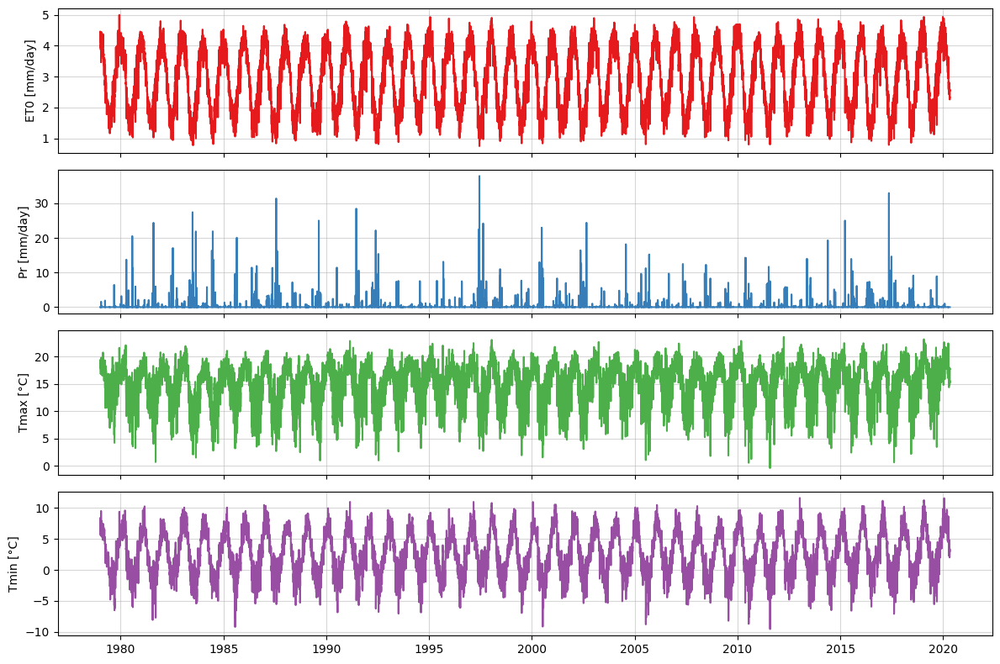

In [11]:
fig, ax = plt.subplots(nrows=4, ncols=1, sharex=True, figsize=(12, 8))
cmap = plt.cm.Set1(range(len(param_tuple)))
for index, info in enumerate(param_tuple):
    param, _, unit = info
    db = eval('%s_db'%param)
    ax[index].plot(db, color=cmap[index])
    ax[index].set_ylabel('%s [%s]'%(param, unit), )
    ax[index].grid(alpha=.5)
plt.tight_layout()

In [14]:
station_info = pd.read_csv(Path(file_dir)/folder_name/'catchment_attributes.csv')
station_info.head()

,gauge_id,3450001,catchment identifier (corresponds to the stream gauge code provided by DGA)
0,gauge_name,Rio Copiapo En Ciudad De Copiapo,gauge name (based on DGA records)
1,gauge_lat,-27.3636,gauge latitude based on DGA records (degrees)
2,gauge_lon,-70.3392,gauge longitude based on DGA records (degrees)
3,record_period_start,1983-01-02,start date of streamflow records
4,record_period_end,2019-01-24,end date of streamflow records


<div class='alert alert-warning'>
    <h2>Preparing for AquaCrop-OSPy</i></h2>
</div>

In [12]:
file_name = '%s.txt'%station
dir_loc = 'C:/Users/bz267/OneDrive - University of Exeter/Documents/chile_project/Crop Modelling Rep'

comb_db = pd.concat([Tmin_db, Tmax_db, Pr_db, ET0_db], axis=1, ).dropna()
Date_df = pd.DataFrame({'Day':comb_db.index.day, 'Month': comb_db.index.month, 'Year':comb_db.index.year})
template_df = pd.DataFrame()
template_df = pd.concat([Date_df, comb_db.reset_index(drop=True)], axis=1, ignore_index=True)
template_df.columns = ['Day', 'Month', 'Year', 'Tmin(C)', 'Tmax(C)', 'Prcp(mm)', 'Et0(mm)']
file_loc = '%s/%s'%(dir_loc, file_name)
template_df.to_csv(file_loc, header=True, index=None, sep='\t')
template_df.head()

,Day,Month,Year,Tmin(C),Tmax(C),Prcp(mm),Et0(mm)
0,1,1,1979,5.764131,18.131131,0.000000,4.288
1,2,1,1979,6.411351,19.105688,0.000000,4.463
2,3,1,1979,8.375680,19.426957,0.000000,4.325
3,4,1,1979,7.950497,18.685844,0.005332,4.179
4,5,1,1979,7.296633,18.244931,0.043821,4.146


<div class='alert alert-warning'>
    <h2>Importing for AquaCrop-OSPy</i></h2>
</div>

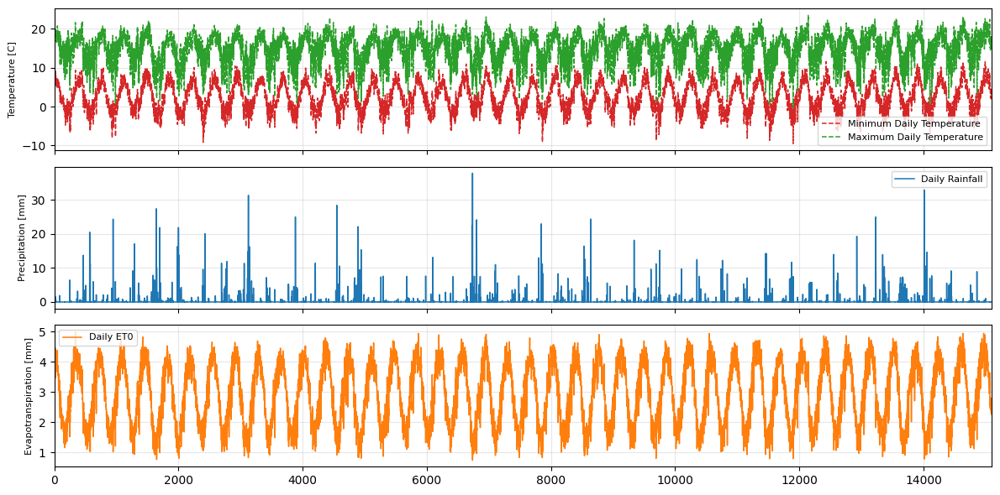

In [8]:
file_name = '%s.txt'%station
dir_loc = 'C:/Users/bz267/OneDrive - University of Exeter/Documents/chile_project/Crop Modelling Rep'

file_loc = '%s/%s'%(dir_loc, file_name)
weather_df = prepare_weather(file_loc)
plot_weather_data(weather_df)

<div class='alert alert-warning'>
    <h2>Tests and Debugs</i></h2>
</div>

### Testing the calbrated model

In [9]:
planting_date = '11/15' #mm/dd 11/15 - 12/20
sim_start_time = '1998/10/01' #YYYY/MM/DD
sim_end_time = '2019/01/01'
c_name  = 'Tomato'
soil = Soil(soil_type='SandyLoam') #'LoamySand'
initial_water_content = InitialWaterContent(value=['FC'])
crop = Crop(c_name=c_name, planting_date=planting_date)
irrigation_management = IrrigationManagement(irrigation_method=1, SMT=[30]*4, AppEff=80)
field_management = FieldMngt(mulches=True, mulch_pct=100, f_mulch=0.5)

crop.HI0 = .38

In [115]:
model = AquaCropModel(sim_start_time, sim_end_time,
                      weather_df=weather_df,
                      crop=crop,
                      initial_water_content=initial_water_content,
                      soil=soil,
                      irrigation_management=irrigation_management,
                      field_management=field_management)
model.run_model(till_termination=True)
model._outputs.final_stats

,Season,crop Type,Harvest Date (YYYY/MM/DD),Harvest Date (Step),Dry yield (tonne/ha),Fresh yield (tonne/ha),Yield potential (tonne/ha),Seasonal irrigation (mm)
0,0,Tomato,1999-03-05,154,0.881455,17.629106,4.661344,240
1,1,Tomato,2000-03-04,519,1.858865,37.177298,4.681165,240
2,2,Tomato,2001-03-05,885,1.707469,34.149388,4.692478,240
3,3,Tomato,2002-03-05,1250,1.230575,24.611490,4.711606,255
4,4,Tomato,2003-03-05,1615,1.925020,38.500395,4.725340,255
5,5,Tomato,2004-03-04,1980,2.081363,41.627254,4.748101,240
6,6,Tomato,2005-03-05,2346,3.571304,71.426085,4.777178,255
7,7,Tomato,2006-03-05,2711,2.963028,59.260554,4.806932,240
8,8,Tomato,2007-03-05,3076,3.897645,77.952893,4.812974,240
9,9,Tomato,2008-03-04,3441,3.242911,64.858227,4.841954,240


### Testing opt.

#### TLBO

In [144]:
planting_date = '11/15' #mm/dd 11/15 - 12/20
sim_start_time = '1998/10/01' #YYYY/MM/DD
sim_end_time = '2019/01/01'
c_name  = 'Tomato'
soil = Soil(soil_type='SandyLoam') #'LoamySand'
initial_water_content = InitialWaterContent(value=['FC'])
crop = Crop(c_name=c_name, planting_date=planting_date)
field_management = FieldMngt(mulches=True, mulch_pct=100, f_mulch=0.5)

crop.HI0 = .38

In [145]:
min_val, max_val = 0, 100
num_variables = 4

pop_size = 5
iteration = 10

In [146]:
start_time = time.time()

X, best_of, OFS, NFE = teaching_learning_based_optimization(num_variables, min_val, max_val, pop_size, iteration, obj_func)

end_time = time.time()
minute = (end_time-start_time)//60
second = (end_time-start_time)-60*minute
print('Best OF', '='*20)
print(best_of)
print('Variables', '='*18)
print(X)
print('Time', '='*22)
print('Time: %d min and %.2f s'%(minute, second))

Best OF ====================
-0.8647615586773487
Variables ==================
[64.77063367 72.50218559 42.51278317 41.00896461]
Time ======================
Time: 2 min and 8.24 s


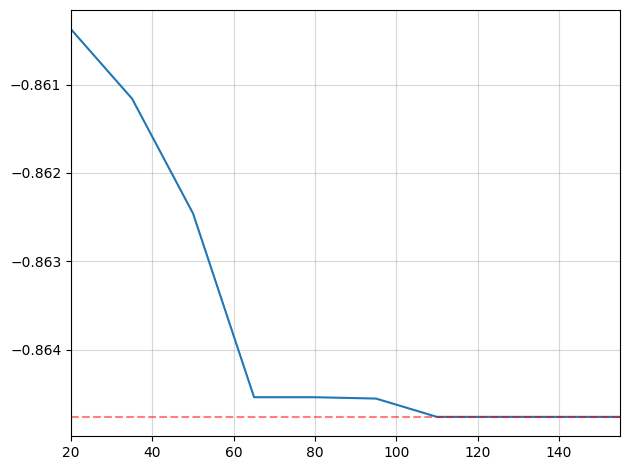

In [150]:
fig = plt.plot(NFE, OFS)
fig = plt.grid(alpha=.5)
fig = plt.margins(0,.05)
fig = plt.axhline(best_of, ls='--', alpha=.5, c='r')
plt.tight_layout()

In [151]:
min_val, max_val = 0, 100
num_variables = 4

pop_size = 20
iteration = 25

In [152]:
start_time = time.time()

X, best_of, OFS, NFE = teaching_learning_based_optimization(num_variables, min_val, max_val, pop_size, iteration, obj_func)

end_time = time.time()
minute = (end_time-start_time)//60
second = (end_time-start_time)-60*minute
print('Best OF', '='*20)
print(best_of)
print('Variables', '='*18)
print(X)
print('Time', '='*22)
print('Time: %d min and %.2f s'%(minute, second))

Best OF ====================
-0.8936094863096583
Variables ==================
[67.99633657 47.87392605 46.95740163 40.57160467]
Time ======================
Time: 23 min and 54.34 s


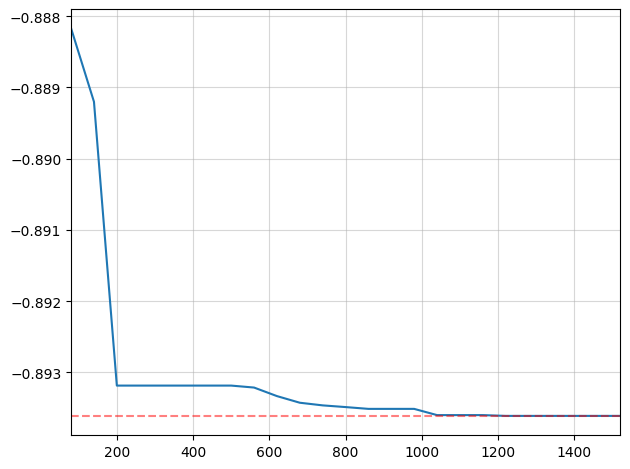

In [153]:
fig = plt.plot(NFE, OFS)
fig = plt.grid(alpha=.5)
fig = plt.margins(0,.05)
fig = plt.axhline(best_of, ls='--', alpha=.5, c='r')
plt.tight_layout()

In [164]:
irrigation_management = IrrigationManagement(irrigation_method=1, SMT=X, AppEff=80)

model = AquaCropModel(sim_start_time, sim_end_time,
                      weather_df=weather_df,
                      crop=crop,
                      initial_water_content=initial_water_content,
                      soil=soil,
                      irrigation_management=irrigation_management,
                      field_management=field_management)
model.run_model(till_termination=True)
model._outputs.final_stats

,Season,crop Type,Harvest Date (YYYY/MM/DD),Harvest Date (Step),Dry yield (tonne/ha),Fresh yield (tonne/ha),Yield potential (tonne/ha),Seasonal irrigation (mm)
0,0,Tomato,1999-03-05,154,1.033330,20.666597,4.690712,300
1,1,Tomato,2000-03-04,519,2.212643,44.252853,4.710879,300
2,2,Tomato,2001-03-05,885,1.993231,39.864614,4.720297,300
3,3,Tomato,2002-03-05,1250,1.420746,28.414927,4.742199,300
4,4,Tomato,2003-03-05,1615,2.295691,45.913817,4.754925,330
5,5,Tomato,2004-03-04,1980,2.506319,50.126385,4.776150,300
6,6,Tomato,2005-03-05,2346,4.185895,83.717904,4.807997,315
7,7,Tomato,2006-03-05,2711,3.525405,70.508091,4.837119,300
8,8,Tomato,2007-03-05,3076,4.728593,94.571855,4.841296,315
9,9,Tomato,2008-03-04,3441,3.819115,76.382302,4.871526,300


In [166]:
fr_y = model._outputs.final_stats['Fresh yield (tonne/ha)']
fr_y.mean(), fr_y.min(), fr_y.max()

(56.50191573411079, 12.718289779723557, 100.84312131400547)

In [147]:
# test result and random generated values and performance
X = np.array([100, 100, 100, 100])
obj_func(X)

-0.7552989724085314

In [148]:
X = np.array([0, 0, 0, 0])
obj_func(X)

-0.7408528404344141

In [149]:
X = np.array([20, 50, 50, 10])
obj_func(X)

-0.8914545994017733

#### STML

In [13]:
station = 'Rio Copiapo En Ciudad De Copiapo'
file_name = '%s.txt'%station
dir_loc = 'C:/Users/bz267/OneDrive - University of Exeter/Documents/chile_project/Crop Modelling Rep'
file_loc = '%s/%s'%(dir_loc, file_name)
weather_df = prepare_weather(file_loc)

c_name  = 'Tomato'
planting_date = '11/15' #mm/dd 11/15 - 12/20
crop = Crop(c_name=c_name, planting_date=planting_date)
crop.HI0 = .38

soil = Soil(soil_type='SandyLoam') #'LoamySand'

initial_water_content = InitialWaterContent(value=['FC'])

# irrigation_management = IrrigationManagement(irrigation_method=1, SMT=[30]*4, AppEff=80)

field_management = FieldMngt(mulches=True, mulch_pct=100, f_mulch=0.5)

sim_start_time = '1998/10/01' #YYYY/MM/DD
sim_end_time = '2019/01/01'

In [14]:
min_val, max_val = 0, 100
num_variables = 4

In [15]:
start_time = time.time()

X, best_of, results_list, NFE_list, setting, setting_list, nums = STML(obj_func, min_val, max_val, num_variables, pop_size_min=15, 
                                                                       pop_size_max=20, iteration_min=15, iteration_max=25,)

end_time = time.time()
minute = (end_time-start_time)//60
second = (end_time-start_time)-60*minute
print('Best OF', '='*20)
print(best_of)
print('Variables', '='*18)
print(X)
print('second layer parametr', '='*18)
print(setting)
print('Number of successful Exploratory & Pattern moves')
print('Exploratory: %d; Pattren: %d'%nums)
print('Time', '='*22)
print('Time: %d min and %.2f s'%(minute, second))

Best OF ====================
[-0.89967692]
Variables ==================
[34.38349778 47.862298   88.71461172 13.97981183]
second layer parametr ==================
[20 27]
Number of successful Exploratory & Pattern moves
Exploratory: 2; Pattren: 0
Time ======================
Time: 349 min and 7.17 s


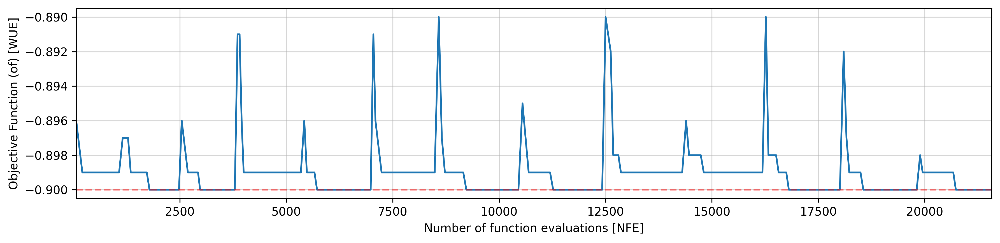

In [25]:
plt.figure(figsize=(12, 3), dpi=300)
plt.plot(NFE_list, [i.round(3) for i in results_list])
plt.grid(alpha=.5)
plt.margins(0,.05)
plt.axhline(best_of.round(3),ls='--',alpha=.5,c='r')
plt.xlabel('Number of function evaluations [NFE]')
plt.ylabel('Objective Function (of) [WUE]')

plt.tight_layout()
plt.savefig('Convergence.png')

In [26]:
db = pd.DataFrame({'NFE':NFE_list, 'of':[i.round(3) for i in results_list]})
db.to_csv('stml_resuts.csv')

In [ ]:
irrigation_management = IrrigationManagement(irrigation_method=1, SMT=X, AppEff=80)

model = AquaCropModel(sim_start_time, sim_end_time,
                      weather_df=weather_df,
                      crop=crop,
                      initial_water_content=initial_water_content,
                      soil=soil,
                      irrigation_management=irrigation_management,
                      field_management=field_management)
model.run_model(till_termination=True)
model._outputs.final_stats

### Model Analysis Automation test [Text and Excel File]

In [11]:
station = 'Rio Copiapo En Ciudad De Copiapo'
file_name = '%s.txt'%station
dir_loc = 'C:/Users/bz267/OneDrive - University of Exeter/Documents/chile_project/Crop Modelling Rep'
file_loc = '%s/%s'%(dir_loc, file_name)
weather_df = prepare_weather(file_loc)

c_name  = 'Tomato'
planting_date = '11/15' #mm/dd 11/15 - 12/20
crop = Crop(c_name=c_name, planting_date=planting_date)
crop.HI0 = .38

soil = Soil(soil_type='SandyLoam') #'LoamySand'

initial_water_content = InitialWaterContent(value=['FC'])

irrigation_management = IrrigationManagement(irrigation_method=1, SMT=[30]*4, AppEff=80)

field_management = FieldMngt(mulches=True, mulch_pct=100, f_mulch=0.5)

sim_start_time = '1998/10/01' #YYYY/MM/DD
sim_end_time = '2019/01/01'

In [15]:
run_model_analysis(weather_df, soil, crop, 
                   initial_water_content, 
                   sim_start_time, sim_end_time,
                   irrigation_management=irrigation_management,
                   field_management=field_management,
                   txt_analysis=True, 
                   crop_plots=False, water_flux_plot=False, climate_plots=False, dpi=100,
                   save_analysis=True,
                   path_dir=r'C:\Users\bz267\OneDrive - University of Exeter\Desktop\Desalination Papers\Technical 2',
                   save_file_n='analysis_summary.csv')

====================        Harvest-Related Results         ====================
	[Avr.] Adj. Harvest Index [%]:					21.88
        Reference Harvest Index [%]:					38.00
====================       Water Flux-Related Results       ====================
	[Avr.] Transpiration [mm]:					238.25
        [Avr.] Evaporation [mm]:					39.15
        [Avr.] Run-Off [mm]:						0.00
        [Avr.] Infiltration [mm]:					201.19
        [Avr.] DeepPerculation [mm]:					0.00
        [Avr.] Irrigation [mm]:						244.50
====================   Yield and Biomass-Related Results    ====================
	[Avr.] Potential Biomass [t/ha]:				12.78
        [Avr.] Biomass [t/ha]:						10.90
        [Avr.] Fresh Yield [t/ha]:					47.80
        [Avr.] Dry Yield [t/ha]:					2.39
====================      Performance-Related Results       ====================
	Crop Ref. Water Productivity [g/m2]:				18.00
        Water Use Efficiency [kg/m3]:					0.862


### Model Analysis Automation test [Plots]

In [8]:
station = 'Rio Copiapo En Ciudad De Copiapo'
file_name = '%s.txt'%station
dir_loc = 'C:/Users/bz267/OneDrive - University of Exeter/Documents/chile_project/Crop Modelling Rep'
file_loc = '%s/%s'%(dir_loc, file_name)
weather_df = prepare_weather(file_loc)

c_name  = 'Tomato'
planting_date = '11/15' #mm/dd 11/15 - 12/20
crop = Crop(c_name=c_name, planting_date=planting_date)
crop.HI0 = .38

soil = Soil(soil_type='SandyLoam') #'LoamySand'

initial_water_content = InitialWaterContent(value=['FC'])

irrigation_management = IrrigationManagement(irrigation_method=1, SMT=[30]*4, AppEff=80)

field_management = FieldMngt(mulches=True, mulch_pct=100, f_mulch=0.5)

sim_start_time = '1998/10/01' #YYYY/MM/DD
sim_end_time = '2019/01/01'

====================        Harvest-Related Results         ====================
	[Avr.] Adj. Harvest Index [%]:					21.88
        Reference Harvest Index [%]:					38.00
====================       Water Flux-Related Results       ====================
	[Avr.] Transpiration [mm]:					238.25
        [Avr.] Evaporation [mm]:					39.15
        [Avr.] Run-Off [mm]:						0.00
        [Avr.] Infiltration [mm]:					201.19
        [Avr.] DeepPerculation [mm]:					0.00
        [Avr.] Irrigation [mm]:						244.50
====================   Yield and Biomass-Related Results    ====================
	[Avr.] Potential Biomass [t/ha]:				12.78
        [Avr.] Biomass [t/ha]:						10.90
        [Avr.] Fresh Yield [t/ha]:					47.80
        [Avr.] Dry Yield [t/ha]:					2.39
====================      Performance-Related Results       ====================
	Crop Ref. Water Productivity [g/m2]:				18.00
        Water Use Efficiency [kg/m3]:					0.862


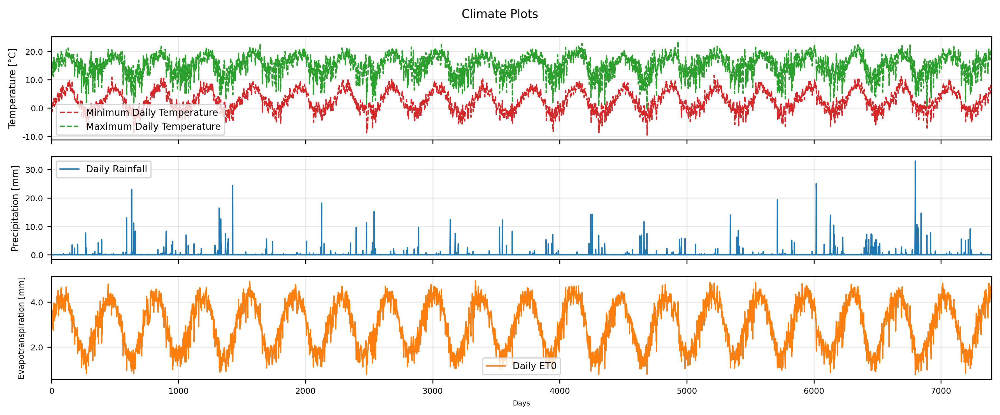

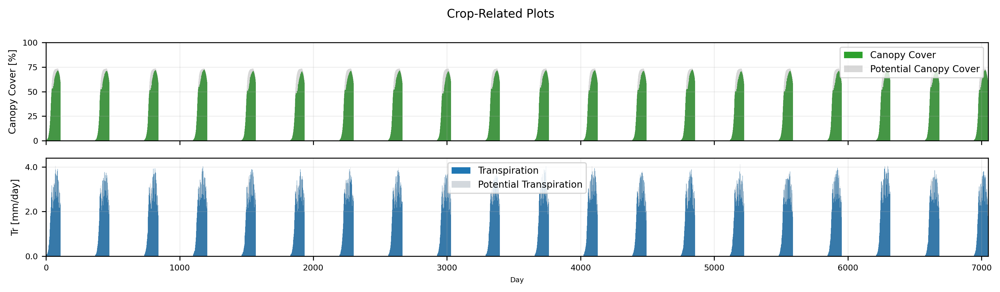

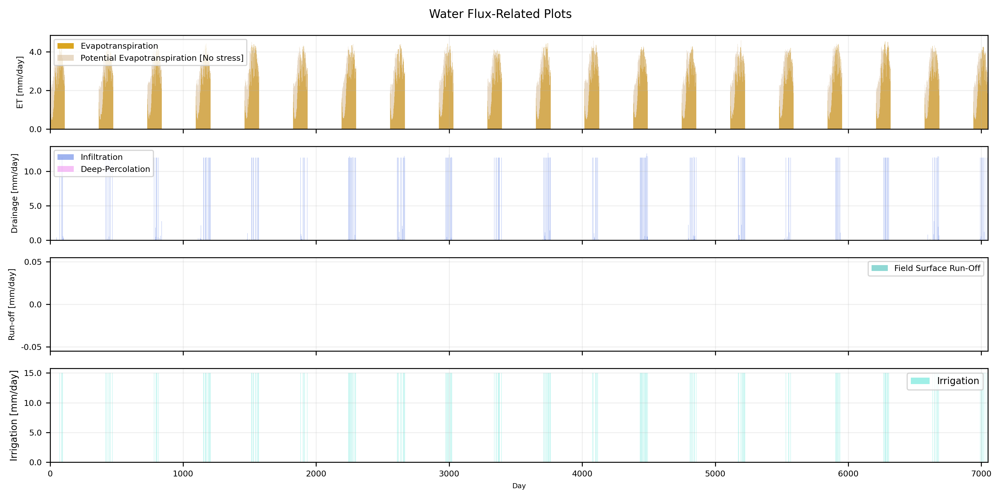

In [15]:
run_model_analysis(weather_df, soil, crop, 
                   initial_water_content, 
                   sim_start_time, sim_end_time,
                   irrigation_management=irrigation_management,
                   field_management=field_management,
                   txt_analysis=True, 
                   crop_plots=True, water_flux_plot=True, climate_plots=True, dpi=300,
                   save_analysis=True,
                   path_dir=r'C:\Users\bz267\OneDrive - University of Exeter\Desktop\Desalination Papers\Technical 2',
                   save_file_n='analysis_summary.csv')

### Diffrent Scenarios

#### Scne. I - BaseLine

In [25]:
station = 'Rio Copiapo En Ciudad De Copiapo'
file_name = '%s.txt'%station
dir_loc = 'C:/Users/bz267/OneDrive - University of Exeter/Documents/chile_project/Crop Modelling Rep'
file_loc = '%s/%s'%(dir_loc, file_name)
weather_df = prepare_weather(file_loc)

c_name  = 'Tomato'
planting_date = '11/15' #mm/dd 11/15 - 12/20
crop = Crop(c_name=c_name, planting_date=planting_date)
crop.HI0 = .38

soil = Soil(soil_type='SandyLoam') #'LoamySand'

initial_water_content = InitialWaterContent(value=['FC'])

irrigation_management = IrrigationManagement(irrigation_method=1, SMT=[30]*4, AppEff=80)

field_management = FieldMngt(mulches=True, mulch_pct=100, f_mulch=0.5)

sim_start_time = '1998/10/01' #YYYY/MM/DD
sim_end_time = '2019/01/01'

====================        Harvest-Related Results         ====================
	[Avr.] Adj. Harvest Index [%]:					21.88
        Reference Harvest Index [%]:					38.00
====================       Water Flux-Related Results       ====================
	[Avr.] Transpiration [mm]:					238.25
        [Avr.] Evaporation [mm]:					39.15
        [Avr.] Run-Off [mm]:						0.00
        [Avr.] Infiltration [mm]:					201.19
        [Avr.] DeepPerculation [mm]:					0.00
        [Avr.] Irrigation [mm]:						244.50
====================   Yield and Biomass-Related Results    ====================
	[Avr.] Potential Biomass [t/ha]:				12.78
        [Avr.] Biomass [t/ha]:						10.90
        [Avr.] Fresh Yield [t/ha]:					47.80
        [Avr.] Dry Yield [t/ha]:					2.39
====================      Performance-Related Results       ====================
	Crop Ref. Water Productivity [g/m2]:				18.00
        Water Use Efficiency [kg/m3]:					0.862


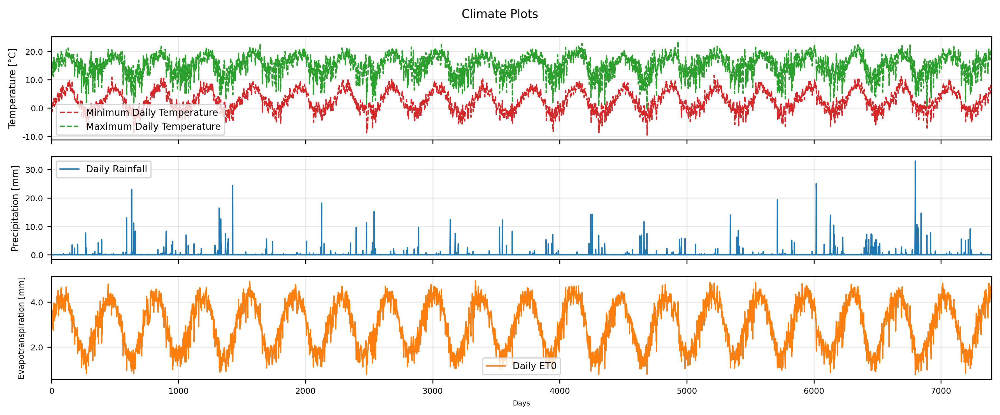

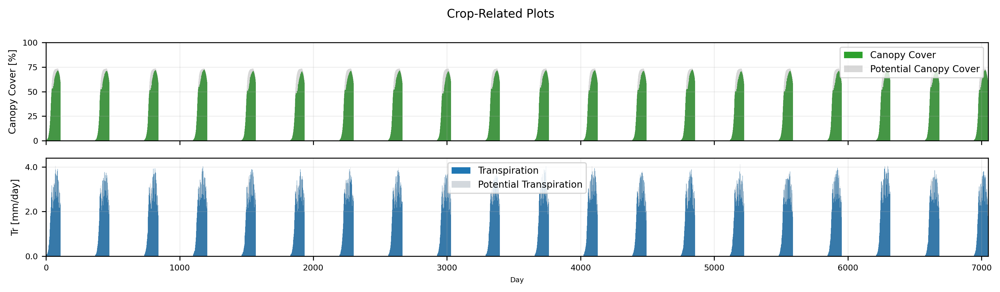

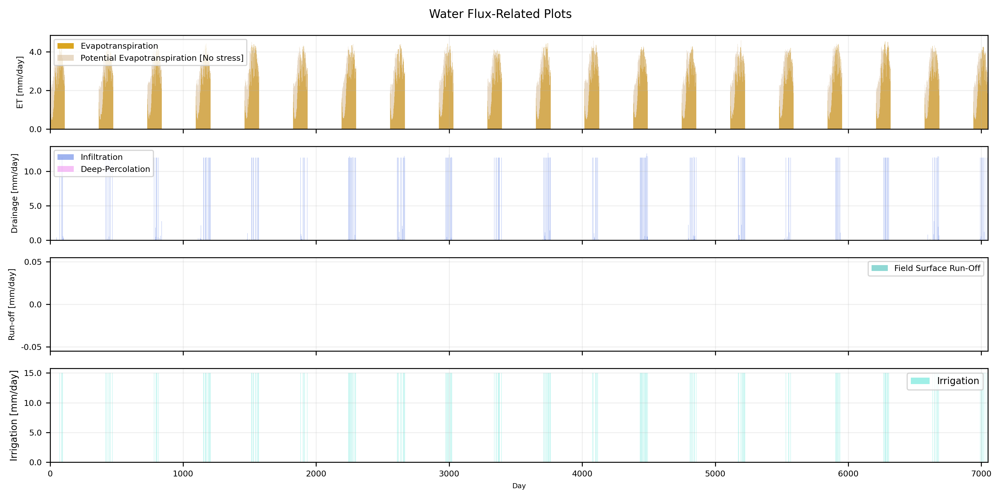

In [26]:
run_model_analysis(weather_df, soil, crop, 
                   initial_water_content, 
                   sim_start_time, sim_end_time,
                   irrigation_management=irrigation_management,
                   field_management=field_management,
                   txt_analysis=True, 
                   crop_plots=True, water_flux_plot=True, climate_plots=True, dpi=300,
                   save_analysis=True,
                   path_dir=r'C:\Users\bz267\OneDrive - University of Exeter\Desktop\Desalination Papers\Technical 2',
                   save_file_n='analysis_summary_baseline.csv')

#### Scne. II - No Irrigation

In [18]:
station = 'Rio Copiapo En Ciudad De Copiapo'
file_name = '%s.txt'%station
dir_loc = 'C:/Users/bz267/OneDrive - University of Exeter/Documents/chile_project/Crop Modelling Rep'
file_loc = '%s/%s'%(dir_loc, file_name)
weather_df = prepare_weather(file_loc)

c_name  = 'Tomato'
planting_date = '11/15' #mm/dd 11/15 - 12/20
crop = Crop(c_name=c_name, planting_date=planting_date)
crop.HI0 = .38

soil = Soil(soil_type='SandyLoam') #'LoamySand'

initial_water_content = InitialWaterContent(value=['FC'])

irrigation_management = IrrigationManagement(irrigation_method=1, SMT=[0]*4, AppEff=80)

field_management = FieldMngt(mulches=True, mulch_pct=100, f_mulch=0.5)

sim_start_time = '1998/10/01' #YYYY/MM/DD
sim_end_time = '2019/01/01'

====================        Harvest-Related Results         ====================
	[Avr.] Adj. Harvest Index [%]:					19.77
        Reference Harvest Index [%]:					38.00
====================       Water Flux-Related Results       ====================
	[Avr.] Transpiration [mm]:					98.22
        [Avr.] Evaporation [mm]:					20.09
        [Avr.] Run-Off [mm]:						0.00
        [Avr.] Infiltration [mm]:					4.62
        [Avr.] DeepPerculation [mm]:					0.00
        [Avr.] Irrigation [mm]:						0.00
====================   Yield and Biomass-Related Results    ====================
	[Avr.] Potential Biomass [t/ha]:				11.44
        [Avr.] Biomass [t/ha]:						4.37
        [Avr.] Fresh Yield [t/ha]:					16.92
        [Avr.] Dry Yield [t/ha]:					0.85
====================      Performance-Related Results       ====================
	Crop Ref. Water Productivity [g/m2]:				18.00
        Water Use Efficiency [kg/m3]:					0.741


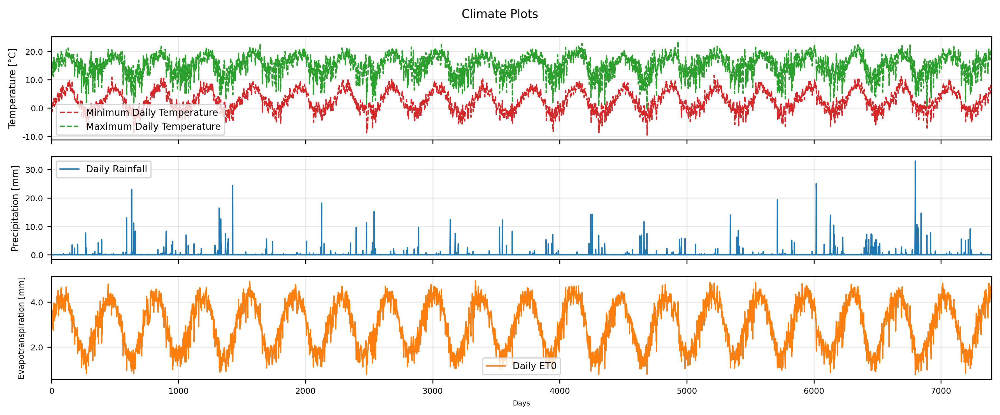

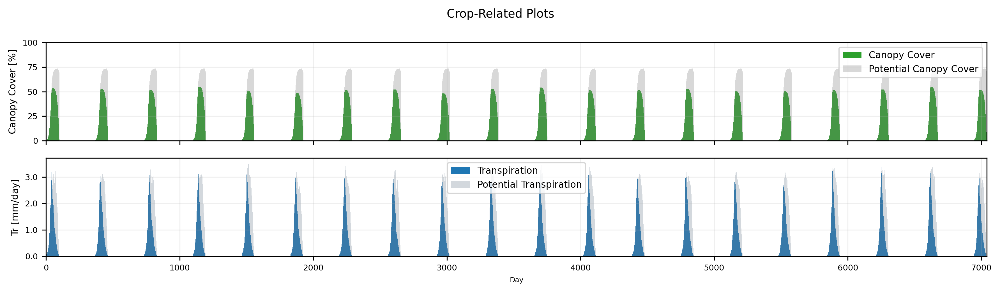

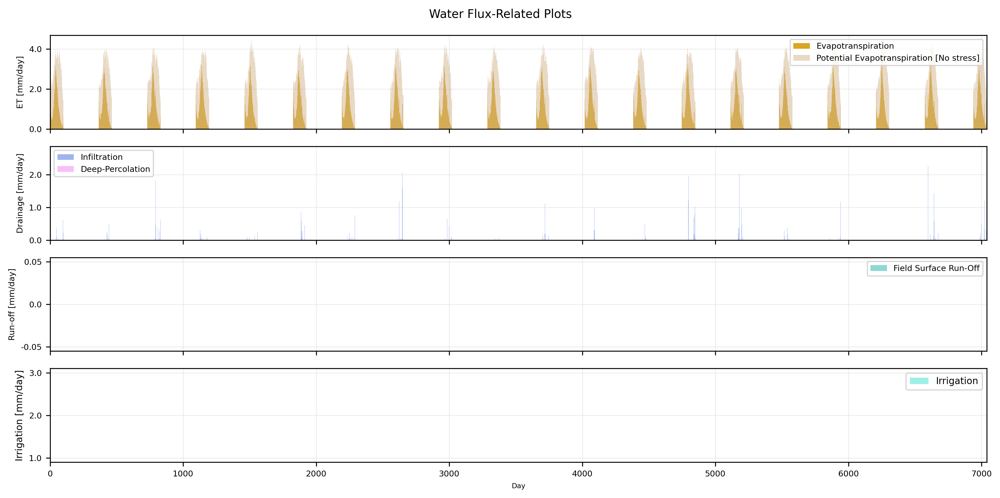

In [19]:
run_model_analysis(weather_df, soil, crop, 
                   initial_water_content, 
                   sim_start_time, sim_end_time,
                   irrigation_management=irrigation_management,
                   field_management=field_management,
                   txt_analysis=True, 
                   crop_plots=True, water_flux_plot=True, climate_plots=True, dpi=300,
                   save_analysis=True,
                   path_dir=r'C:\Users\bz267\OneDrive - University of Exeter\Desktop\Desalination Papers\Technical 2',
                   save_file_n='analysis_summary_no_irrigation.csv')

#### Scen. III - Full Irrigation

In [20]:
station = 'Rio Copiapo En Ciudad De Copiapo'
file_name = '%s.txt'%station
dir_loc = 'C:/Users/bz267/OneDrive - University of Exeter/Documents/chile_project/Crop Modelling Rep'
file_loc = '%s/%s'%(dir_loc, file_name)
weather_df = prepare_weather(file_loc)

c_name  = 'Tomato'
planting_date = '11/15' #mm/dd 11/15 - 12/20
crop = Crop(c_name=c_name, planting_date=planting_date)
crop.HI0 = .38

soil = Soil(soil_type='SandyLoam') #'LoamySand'

initial_water_content = InitialWaterContent(value=['FC'])

irrigation_management = IrrigationManagement(irrigation_method=1, SMT=[100]*4, AppEff=80)

field_management = FieldMngt(mulches=True, mulch_pct=100, f_mulch=0.5)

sim_start_time = '1998/10/01' #YYYY/MM/DD
sim_end_time = '2019/01/01'

====================        Harvest-Related Results         ====================
	[Avr.] Adj. Harvest Index [%]:					22.28
        Reference Harvest Index [%]:					38.00
====================       Water Flux-Related Results       ====================
	[Avr.] Transpiration [mm]:					284.56
        [Avr.] Evaporation [mm]:					99.74
        [Avr.] Run-Off [mm]:						0.00
        [Avr.] Infiltration [mm]:					896.59
        [Avr.] DeepPerculation [mm]:					510.03
        [Avr.] Irrigation [mm]:						1113.75
====================   Yield and Biomass-Related Results    ====================
	[Avr.] Potential Biomass [t/ha]:				13.04
        [Avr.] Biomass [t/ha]:						12.99
        [Avr.] Fresh Yield [t/ha]:					58.10
        [Avr.] Dry Yield [t/ha]:					2.90
====================      Performance-Related Results       ====================
	Crop Ref. Water Productivity [g/m2]:				18.00
        Water Use Efficiency [kg/m3]:					0.755


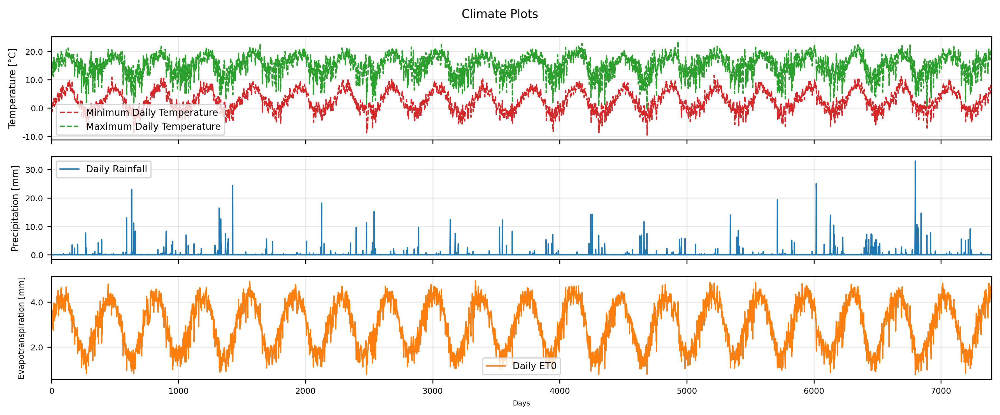

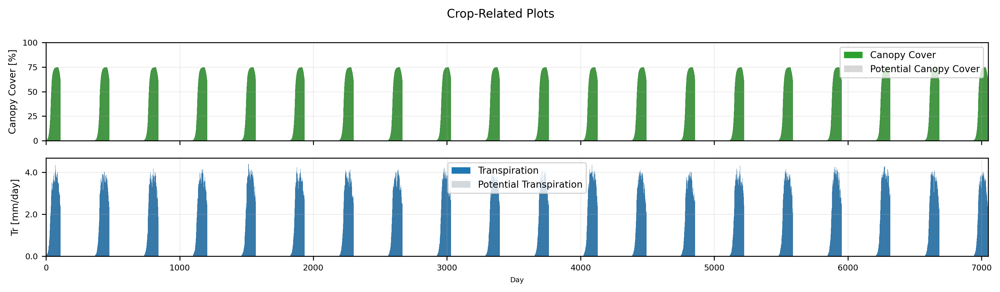

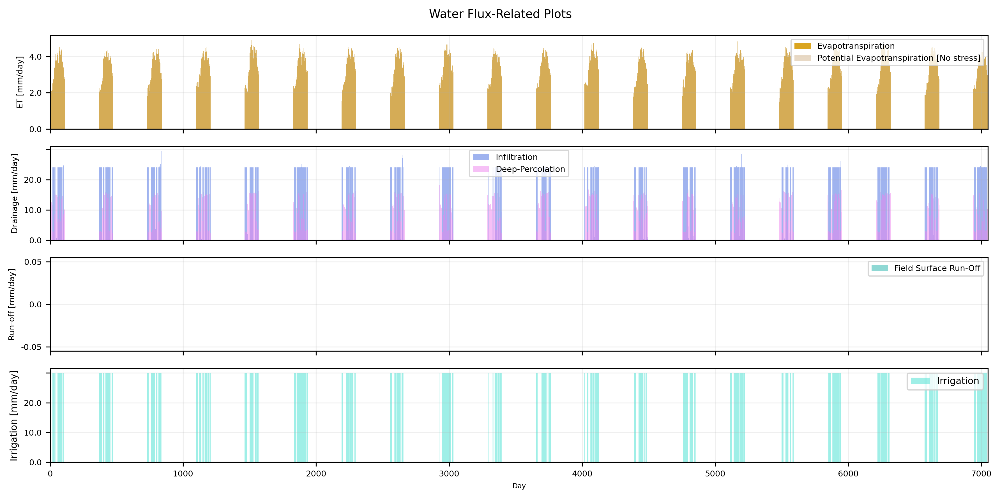

In [21]:
run_model_analysis(weather_df, soil, crop, 
                   initial_water_content, 
                   sim_start_time, sim_end_time,
                   irrigation_management=irrigation_management,
                   field_management=field_management,
                   txt_analysis=True, 
                   crop_plots=True, water_flux_plot=True, climate_plots=True, dpi=300,
                   save_analysis=True,
                   path_dir=r'C:\Users\bz267\OneDrive - University of Exeter\Desktop\Desalination Papers\Technical 2',
                   save_file_n='analysis_summary_full_irrigation.csv')

#### Scen IV - Opt. Irrigation [deficit irrigation] - WUE as of

In [27]:
station = 'Rio Copiapo En Ciudad De Copiapo'
file_name = '%s.txt'%station
dir_loc = 'C:/Users/bz267/OneDrive - University of Exeter/Documents/chile_project/Crop Modelling Rep'
file_loc = '%s/%s'%(dir_loc, file_name)
weather_df = prepare_weather(file_loc)

c_name  = 'Tomato'
planting_date = '11/15' #mm/dd 11/15 - 12/20
crop = Crop(c_name=c_name, planting_date=planting_date)
crop.HI0 = .38

soil = Soil(soil_type='SandyLoam') #'LoamySand'

initial_water_content = InitialWaterContent(value=['FC'])

irrigation_management = IrrigationManagement(irrigation_method=1, SMT=np.array([38.372, 47.856, 89.76, 11.752]), AppEff=80)

field_management = FieldMngt(mulches=True, mulch_pct=100, f_mulch=0.5)

sim_start_time = '1998/10/01' #YYYY/MM/DD
sim_end_time = '2019/01/01'

====================        Harvest-Related Results         ====================
	[Avr.] Adj. Harvest Index [%]:					22.28
        Reference Harvest Index [%]:					38.00
====================       Water Flux-Related Results       ====================
	[Avr.] Transpiration [mm]:					277.42
        [Avr.] Evaporation [mm]:					37.41
        [Avr.] Run-Off [mm]:						0.00
        [Avr.] Infiltration [mm]:					253.39
        [Avr.] DeepPerculation [mm]:					0.00
        [Avr.] Irrigation [mm]:						309.75
====================   Yield and Biomass-Related Results    ====================
	[Avr.] Potential Biomass [t/ha]:				12.86
        [Avr.] Biomass [t/ha]:						12.67
        [Avr.] Fresh Yield [t/ha]:					56.66
        [Avr.] Dry Yield [t/ha]:					2.83
====================      Performance-Related Results       ====================
	Crop Ref. Water Productivity [g/m2]:				18.00
        Water Use Efficiency [kg/m3]:					0.900


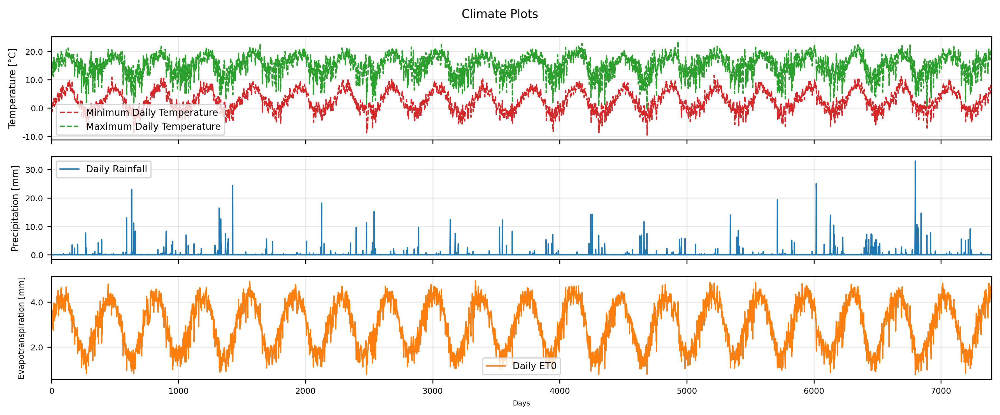

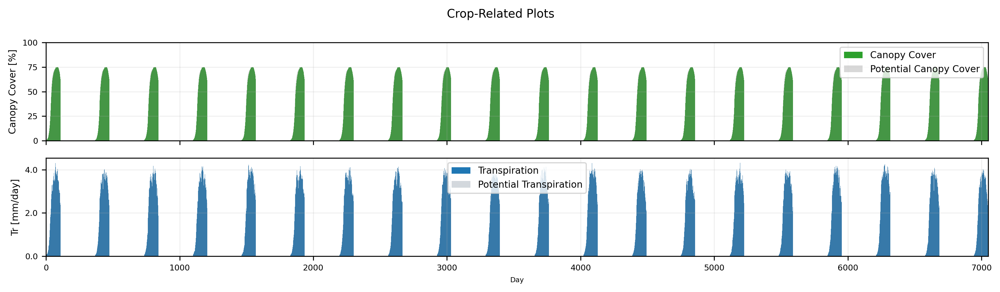

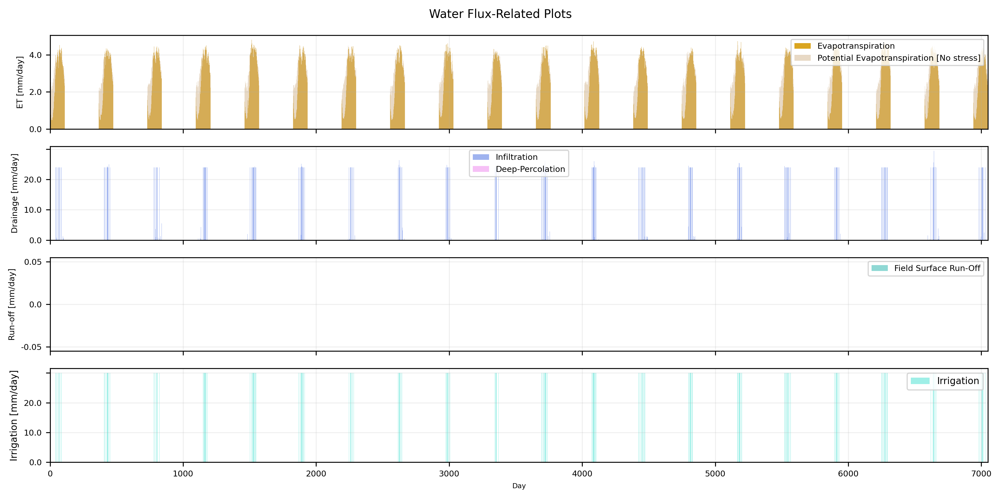

In [28]:
run_model_analysis(weather_df, soil, crop, 
                   initial_water_content, 
                   sim_start_time, sim_end_time,
                   irrigation_management=irrigation_management,
                   field_management=field_management,
                   txt_analysis=True, 
                   crop_plots=True, water_flux_plot=True, climate_plots=True, dpi=300,
                   save_analysis=True,
                   path_dir=r'C:\Users\bz267\OneDrive - University of Exeter\Desktop\Desalination Papers\Technical 2',
                   save_file_n='analysis_summary_opt_wue.csv')

#### Scen V - Opt. Irrigation [deficit irrigation] - Re-adjusted PD 

In [3]:
station = 'Rio Copiapo En Ciudad De Copiapo'
file_name = '%s.txt'%station
dir_loc = 'C:/Users/bz267/OneDrive - University of Exeter/Documents/chile_project/Crop Modelling Rep'
file_loc = '%s/%s'%(dir_loc, file_name)
weather_df = prepare_weather(file_loc)

c_name  = 'Tomato'
planting_date = '12/15' #mm/dd 11/15 - 12/20
crop = Crop(c_name=c_name, planting_date=planting_date)
crop.HI0 = .38

soil = Soil(soil_type='SandyLoam') #'LoamySand'

initial_water_content = InitialWaterContent(value=['FC'])

irrigation_management = IrrigationManagement(irrigation_method=1, SMT=np.array([20.33, 47.084, 86.889, 12.115]), AppEff=80)

field_management = FieldMngt(mulches=True, mulch_pct=100, f_mulch=0.5)

sim_start_time = '1998/10/01' #YYYY/MM/DD
sim_end_time = '2019/01/01'

In [6]:
model = AquaCropModel(sim_start_time, sim_end_time,
                      weather_df=weather_df,
                      crop=crop,
                      initial_water_content=initial_water_content,
                      soil=soil,
                      irrigation_management=irrigation_management,
                      field_management=field_management)
model.run_model(till_termination=True)
model._outputs.final_stats

,Season,crop Type,Harvest Date (YYYY/MM/DD),Harvest Date (Step),Dry yield (tonne/ha),Fresh yield (tonne/ha),Yield potential (tonne/ha),Seasonal irrigation (mm)
0,0,Tomato,1999-04-04,184,4.602936,92.058723,4.682479,270
1,1,Tomato,2000-04-03,549,2.347162,46.943230,4.705669,285
2,2,Tomato,2001-04-04,915,4.611152,92.223034,4.708278,270
3,3,Tomato,2002-04-04,1280,2.787386,55.747710,4.729651,285
4,4,Tomato,2003-04-04,1645,4.637062,92.741240,4.751170,300
5,5,Tomato,2004-04-03,2010,4.158835,83.176705,4.788111,285
6,6,Tomato,2005-04-04,2376,2.966337,59.326744,4.807076,285
7,7,Tomato,2006-04-04,2741,4.753235,95.064706,4.830486,285
8,8,Tomato,2007-04-04,3106,1.952102,39.042039,4.848822,285
9,9,Tomato,2008-04-03,3471,1.282520,25.650395,4.860036,270


====================        Harvest-Related Results         ====================
	[Avr.] Adj. Harvest Index [%]:					30.44
        Reference Harvest Index [%]:					38.00
====================       Water Flux-Related Results       ====================
	[Avr.] Transpiration [mm]:					252.20
        [Avr.] Evaporation [mm]:					39.21
        [Avr.] Run-Off [mm]:						0.10
        [Avr.] Infiltration [mm]:					236.25
        [Avr.] DeepPerculation [mm]:					0.55
        [Avr.] Irrigation [mm]:						282.75
====================   Yield and Biomass-Related Results    ====================
	[Avr.] Potential Biomass [t/ha]:				12.84
        [Avr.] Biomass [t/ha]:						12.61
        [Avr.] Fresh Yield [t/ha]:					76.85
        [Avr.] Dry Yield [t/ha]:					3.84
====================      Performance-Related Results       ====================
	Crop Ref. Water Productivity [g/m2]:				18.00
        Water Use Efficiency [kg/m3]:					1.319


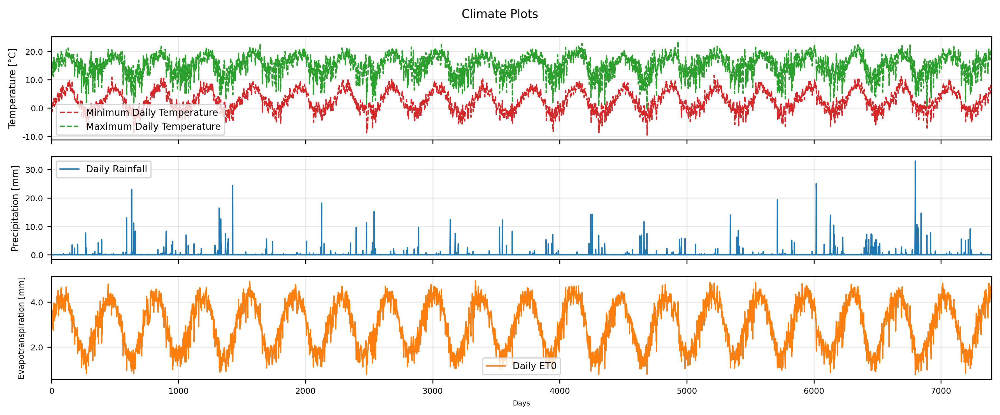

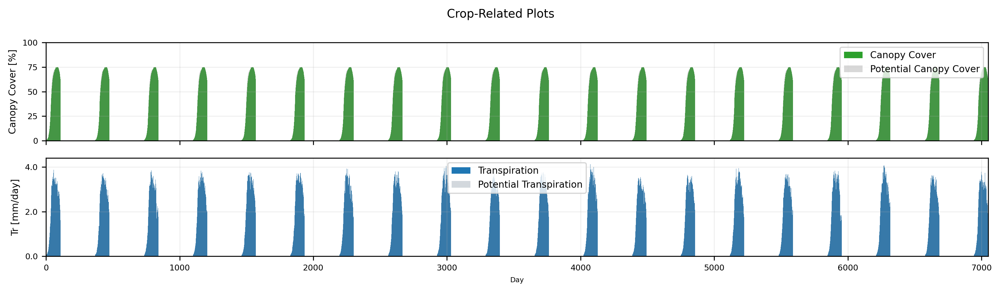

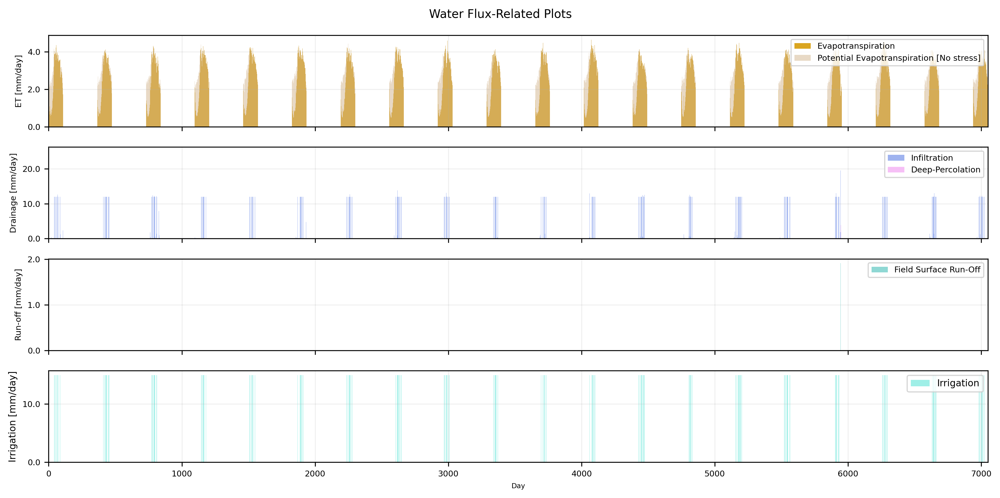

In [26]:
run_model_analysis(weather_df, soil, crop, 
                   initial_water_content, 
                   sim_start_time, sim_end_time,
                   irrigation_management=irrigation_management,
                   field_management=field_management,
                   txt_analysis=True, 
                   crop_plots=True, water_flux_plot=True, climate_plots=True, dpi=300,
                   save_analysis=True,
                   path_dir=r'C:\Users\bz267\OneDrive - University of Exeter\Desktop\Desalination Papers\Technical 2',
                   save_file_n='analysis_summary_opt_re_pd.csv')

#### Scen VI - Opt. Irrigation - Re-adjusted PD -No Irrigation

In [29]:
station = 'Rio Copiapo En Ciudad De Copiapo'
file_name = '%s.txt'%station
dir_loc = 'C:/Users/bz267/OneDrive - University of Exeter/Documents/chile_project/Crop Modelling Rep'
file_loc = '%s/%s'%(dir_loc, file_name)
weather_df = prepare_weather(file_loc)

c_name  = 'Tomato'
planting_date = '12/15' #mm/dd 11/15 - 12/20
crop = Crop(c_name=c_name, planting_date=planting_date)
crop.HI0 = .38

soil = Soil(soil_type='SandyLoam') #'LoamySand'

initial_water_content = InitialWaterContent(value=['FC'])

irrigation_management = IrrigationManagement(irrigation_method=1, SMT=np.array([0]*4), AppEff=80)

field_management = FieldMngt(mulches=True, mulch_pct=100, f_mulch=0.5)

sim_start_time = '1998/10/01' #YYYY/MM/DD
sim_end_time = '2019/01/01'

====================        Harvest-Related Results         ====================
	[Avr.] Adj. Harvest Index [%]:					26.66
        Reference Harvest Index [%]:					38.00
====================       Water Flux-Related Results       ====================
	[Avr.] Transpiration [mm]:					97.30
        [Avr.] Evaporation [mm]:					22.72
        [Avr.] Run-Off [mm]:						0.08
        [Avr.] Infiltration [mm]:					9.70
        [Avr.] DeepPerculation [mm]:					0.00
        [Avr.] Irrigation [mm]:						0.00
====================   Yield and Biomass-Related Results    ====================
	[Avr.] Potential Biomass [t/ha]:				11.75
        [Avr.] Biomass [t/ha]:						4.47
        [Avr.] Fresh Yield [t/ha]:					23.79
        [Avr.] Dry Yield [t/ha]:					1.19
====================      Performance-Related Results       ====================
	Crop Ref. Water Productivity [g/m2]:				18.00
        Water Use Efficiency [kg/m3]:					1.005


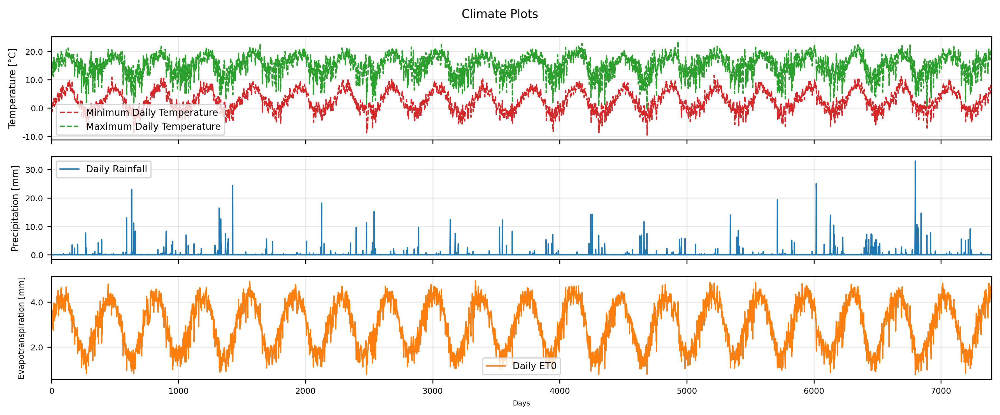

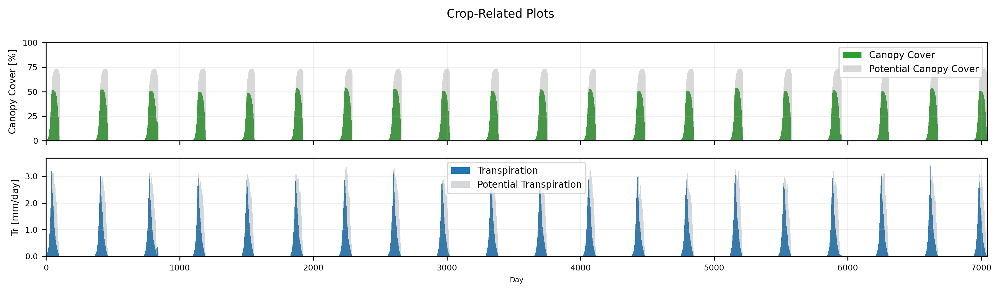

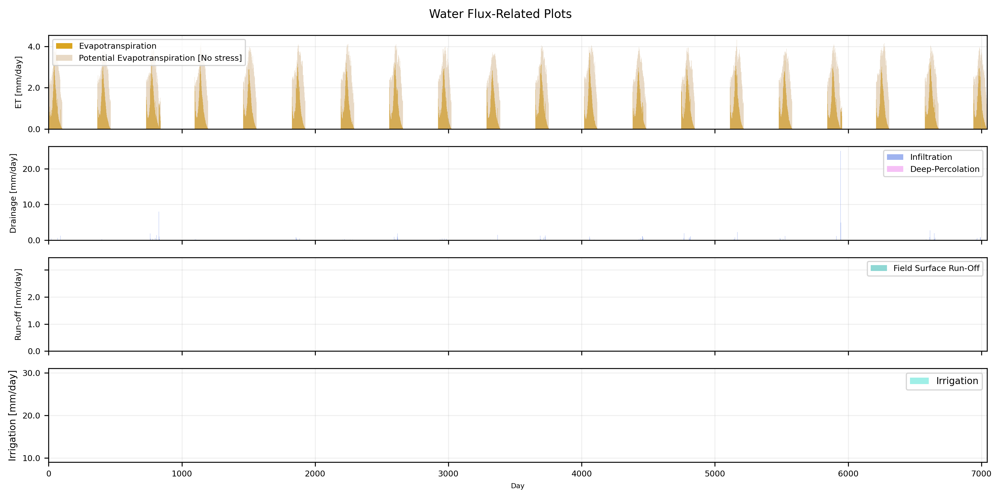

In [30]:
run_model_analysis(weather_df, soil, crop, 
                   initial_water_content, 
                   sim_start_time, sim_end_time,
                   irrigation_management=irrigation_management,
                   field_management=field_management,
                   txt_analysis=True, 
                   crop_plots=True, water_flux_plot=True, climate_plots=True, dpi=300,
                   save_analysis=True,
                   path_dir=r'C:\Users\bz267\OneDrive - University of Exeter\Desktop\Desalination Papers\Technical 2',
                   save_file_n='analysis_summary_re_pd_No_irr.csv')

#### Scen VII - Opt. Irrigation - Re-adjusted PD - Full Irrigation

In [31]:
station = 'Rio Copiapo En Ciudad De Copiapo'
file_name = '%s.txt'%station
dir_loc = 'C:/Users/bz267/OneDrive - University of Exeter/Documents/chile_project/Crop Modelling Rep'
file_loc = '%s/%s'%(dir_loc, file_name)
weather_df = prepare_weather(file_loc)

c_name  = 'Tomato'
planting_date = '12/15' #mm/dd 11/15 - 12/20
crop = Crop(c_name=c_name, planting_date=planting_date)
crop.HI0 = .38

soil = Soil(soil_type='SandyLoam') #'LoamySand'

initial_water_content = InitialWaterContent(value=['FC'])

irrigation_management = IrrigationManagement(irrigation_method=1, SMT=np.array([100]*4), AppEff=80)

field_management = FieldMngt(mulches=True, mulch_pct=100, f_mulch=0.5)

sim_start_time = '1998/10/01' #YYYY/MM/DD
sim_end_time = '2019/01/01'

====================        Harvest-Related Results         ====================
	[Avr.] Adj. Harvest Index [%]:					30.44
        Reference Harvest Index [%]:					38.00
====================       Water Flux-Related Results       ====================
	[Avr.] Transpiration [mm]:					260.66
        [Avr.] Evaporation [mm]:					99.36
        [Avr.] Run-Off [mm]:						0.26
        [Avr.] Infiltration [mm]:					827.09
        [Avr.] DeepPerculation [mm]:					463.00
        [Avr.] Irrigation [mm]:						1021.50
====================   Yield and Biomass-Related Results    ====================
	[Avr.] Potential Biomass [t/ha]:				13.04
        [Avr.] Biomass [t/ha]:						12.99
        [Avr.] Fresh Yield [t/ha]:					79.18
        [Avr.] Dry Yield [t/ha]:					3.96
====================      Performance-Related Results       ====================
	Crop Ref. Water Productivity [g/m2]:				18.00
        Water Use Efficiency [kg/m3]:					1.099


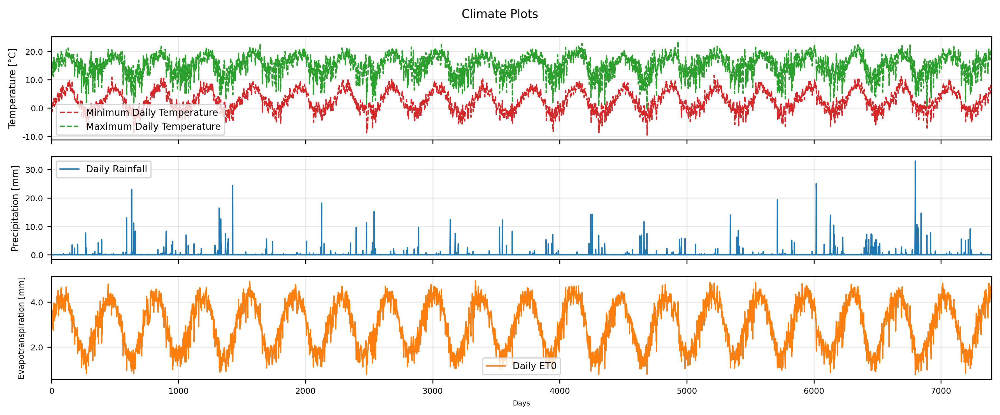

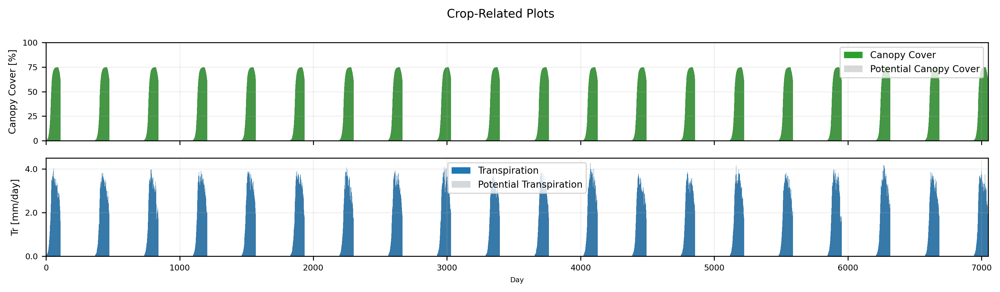

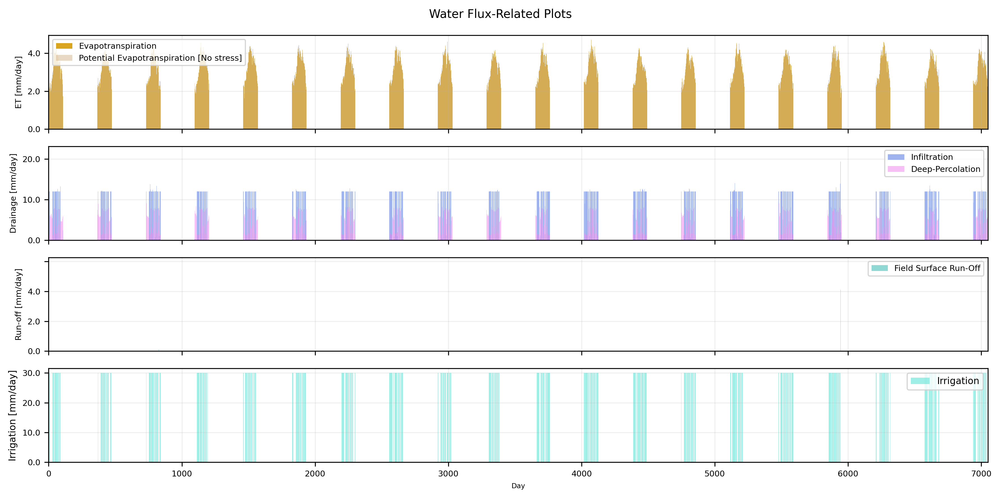

In [32]:
run_model_analysis(weather_df, soil, crop, 
                   initial_water_content, 
                   sim_start_time, sim_end_time,
                   irrigation_management=irrigation_management,
                   field_management=field_management,
                   txt_analysis=True, 
                   crop_plots=True, water_flux_plot=True, climate_plots=True, dpi=300,
                   save_analysis=True,
                   path_dir=r'C:\Users\bz267\OneDrive - University of Exeter\Desktop\Desalination Papers\Technical 2',
                   save_file_n='analysis_summary_re_pd_full_Irr.csv')

### Comparing Scenarios

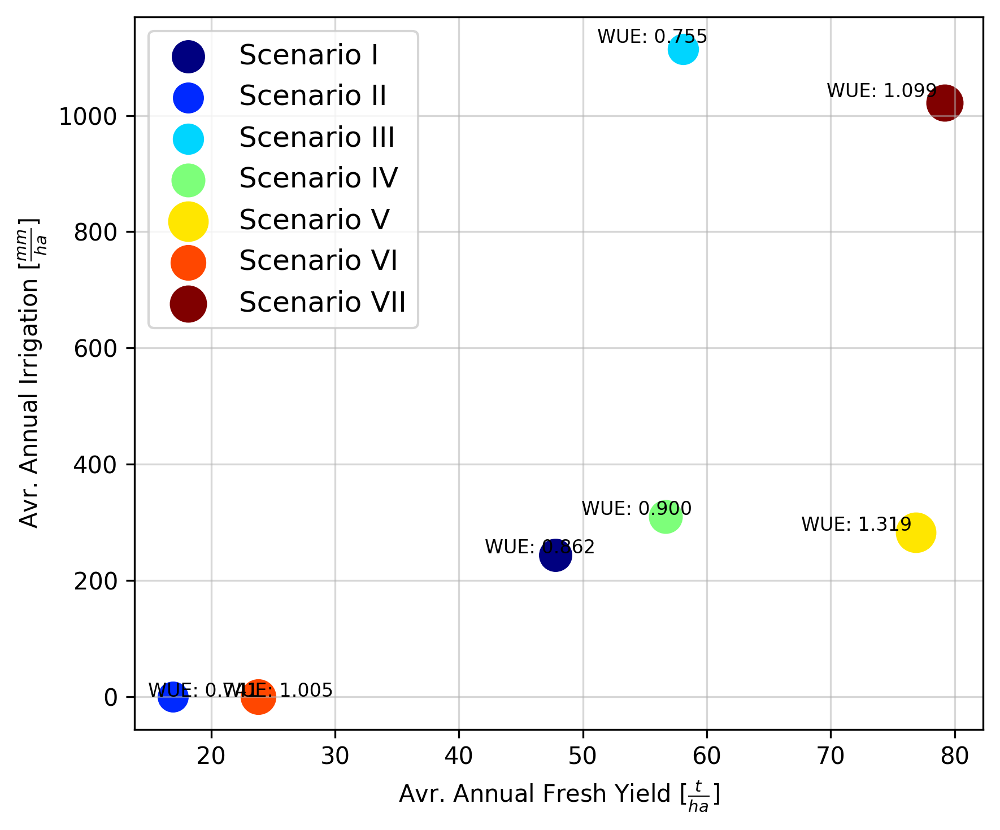

In [34]:
path_dir = r'C:\Users\bz267\OneDrive - University of Exeter\Desktop\Desalination Papers\Technical 2'
dpi = 300


all_files = os.listdir(path_dir)
analysis_files = [i for i in all_files if (i.endswith('.csv'))and(i.startswith('analysis_summary_'))]
scenario_names = [i.removeprefix('analysis_summary_').removesuffix('.csv') for i in analysis_files]
scenario_names = [i.replace('_', ' ') for i in scenario_names]

size_scale = 200
cmap = plt.cm.jet(np.linspace(0, 1, len(scenario_names)))
plt.figure(figsize=(6, 5), dpi=dpi)
fy_valeus = list()
ir_values = list()
WUE_values = list()
for index in range(len(scenario_names)):
    db_means = pd.read_csv(Path(path_dir)/analysis_files[index]).mean()
    fy_value = db_means['Fresh Yield']
    ir_value = db_means['Irrigation']
    WUE_value = db_means['WUE']
    fy_valeus.append(fy_value)
    ir_values.append(ir_value)
    WUE_values.append(WUE_value)
    plt.scatter(x=fy_value, y=ir_value, s=WUE_value*size_scale, color=cmap[index], label=scenario_names[index])
    plt.annotate(text='WUE: %.3f'%(WUE_value), xy=(.88*fy_value, ir_value*1.01), fontsize=8)
plt.legend(fontsize=12)
plt.grid(alpha=.5)
plt.xlabel(r'Avr. Annual Fresh Yield [$\frac{t}{ha}$]')
plt.ylabel(r'Avr. Annual Irrigation [$\frac{mm}{ha}$]')

plt.tight_layout()

               In some cases adjust_text might fail, if possible update
               matplotlib to version >=3.5.0


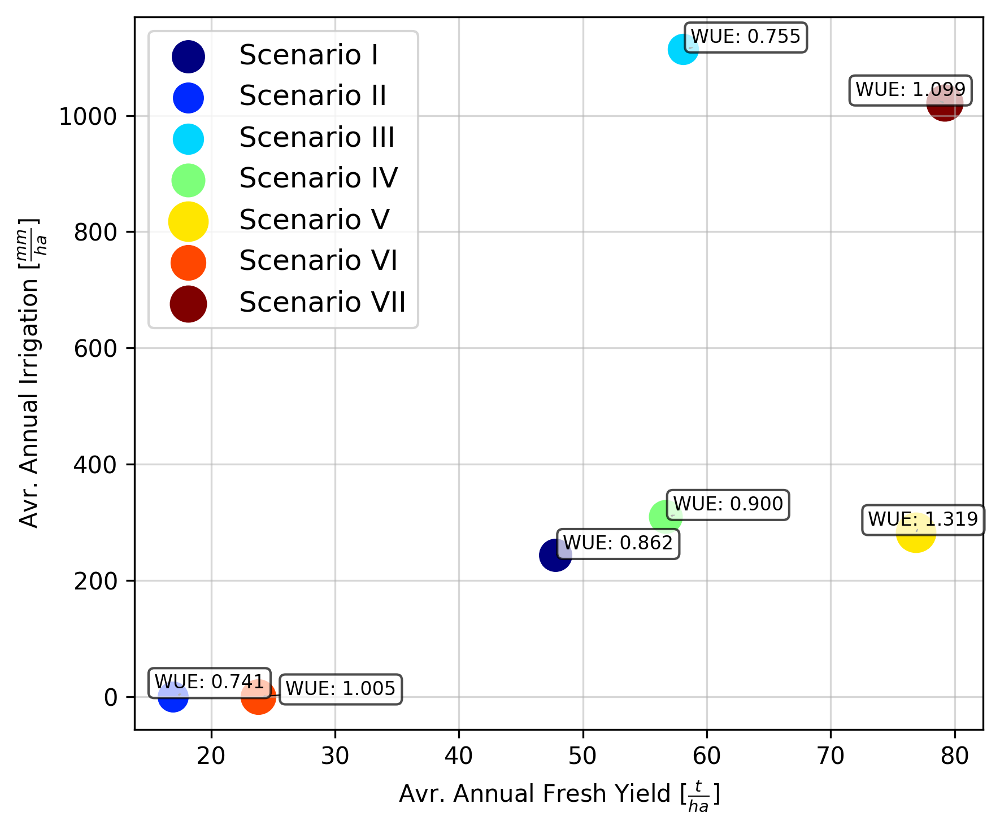

In [11]:
# Define directory and settings
path_dir = r'C:\Users\bz267\OneDrive - University of Exeter\Desktop\Desalination Papers\Technical 2'
dpi = 300
size_scale = 200

# Get list of relevant files
all_files = os.listdir(path_dir)
analysis_files = [i for i in all_files if (i.endswith('.csv')) and (i.startswith('analysis_summary_'))]
scenario_names = [i.removeprefix('analysis_summary_').removesuffix('.csv') for i in analysis_files]
scenario_names = [i.replace('_', ' ') for i in scenario_names]

# Set color map
cmap = plt.cm.jet(np.linspace(0, 1, len(scenario_names)))

# Create figure
plt.figure(figsize=(6, 5), dpi=dpi)

# List to store text labels for adjustment
texts = []
fy_values = list()
ir_values = list()
WUE_values = list()

# Loop through scenarios
for index in range(len(scenario_names)):
    db_means = pd.read_csv(Path(path_dir) / analysis_files[index]).mean()
    
    fy_value = db_means['Fresh Yield']
    ir_value = db_means['Irrigation']
    WUE_value = db_means['WUE']
    fy_values.append(fy_value)
    ir_values.append(ir_value)
    WUE_values.append(WUE_value)
    plt.scatter(x=fy_value, y=ir_value, s=WUE_value * size_scale, color=cmap[index], label=scenario_names[index])
    
    # Annotation with bounding box for readability
    text = plt.annotate(
        text=f'WUE: {WUE_value:.3f}', 
        xy=(fy_value, ir_value), 
        fontsize=8, 
        bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white', alpha=0.7)
    )
    
    texts.append(text)

# Adjust text positions to prevent overlapping
adjust_text(texts, arrowprops=dict(arrowstyle='->', color='black', lw=0.5))


# Finalize plot
plt.legend(fontsize=12)
plt.grid(alpha=0.5)
plt.xlabel(r'Avr. Annual Fresh Yield [$\frac{t}{ha}$]')
plt.ylabel(r'Avr. Annual Irrigation [$\frac{mm}{ha}$]')
plt.tight_layout()

# Show plot
plt.savefig('scen_compare.png')

               In some cases adjust_text might fail, if possible update
               matplotlib to version >=3.5.0


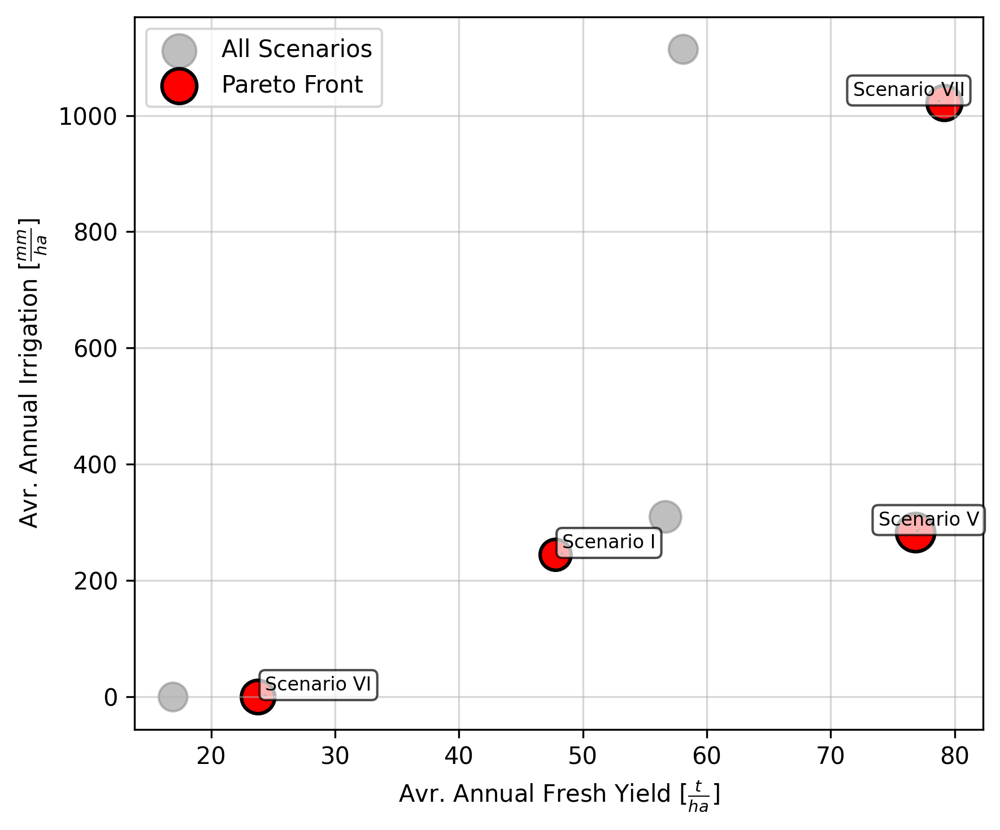

In [13]:
# Define directory and settings
path_dir = r'C:\Users\bz267\OneDrive - University of Exeter\Desktop\Desalination Papers\Technical 2'
dpi = 300
size_scale = 200

# Get list of relevant files
all_files = os.listdir(path_dir)
analysis_files = [i for i in all_files if (i.endswith('.csv')) and (i.startswith('analysis_summary_'))]
scenario_names = [i.removeprefix('analysis_summary_').removesuffix('.csv') for i in analysis_files]
scenario_names = [i.replace('_', ' ') for i in scenario_names]

# Set color map
cmap = plt.cm.jet(np.linspace(0, 1, len(scenario_names)))

# Lists to store extracted values
fy_values, ir_values, WUE_values = [], [], []

# Loop through scenarios
for index in range(len(scenario_names)):
    db_means = pd.read_csv(Path(path_dir) / analysis_files[index]).mean()
    
    fy_values.append(db_means['Fresh Yield'])
    ir_values.append(db_means['Irrigation'])
    WUE_values.append(db_means['WUE'])

# Create a dataframe with the results
scn_sum_db = pd.DataFrame({
    'Scenario': scenario_names,
    'Fresh Yield': fy_values, 
    'Irrigation': ir_values,
    'WUE': WUE_values
})

### **Pareto Front Computation**
def is_pareto_efficient(costs):
    """ Returns a boolean array indicating Pareto-efficient points. """
    is_efficient = np.ones(costs.shape[0], dtype=bool)
    for i, c in enumerate(costs):
        if is_efficient[i]:
            # Keep points that are not dominated
            is_efficient[is_efficient] = np.any(costs[is_efficient] < c, axis=1) | (costs[is_efficient] == c).all(axis=1)
    return is_efficient

# Convert to numpy array for faster computation
costs = np.column_stack((scn_sum_db['Irrigation'].values, -scn_sum_db['Fresh Yield'].values))  # Negative yield for maximization
pareto_mask = is_pareto_efficient(costs)

# Extract Pareto-optimal solutions
pareto_solutions = scn_sum_db[pareto_mask]

### **Plotting with Pareto Front Highlighted**
plt.figure(figsize=(6, 5), dpi=dpi)
texts = []

# Scatter plot for all points
plt.scatter(scn_sum_db['Fresh Yield'], scn_sum_db['Irrigation'], s=scn_sum_db['WUE'] * size_scale, color='gray', alpha=0.5, label="All Scenarios")

# Highlight Pareto front points
plt.scatter(pareto_solutions['Fresh Yield'], pareto_solutions['Irrigation'], s=pareto_solutions['WUE'] * size_scale, color='red', edgecolors='black', linewidth=1.5, label="Pareto Front")

# Add annotations
for i, row in pareto_solutions.iterrows():
    text = plt.annotate(
        text=row['Scenario'],
        xy=(row['Fresh Yield'], row['Irrigation']),
        fontsize=8,
        bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white', alpha=0.7)
    )
    texts.append(text)

# Adjust text to prevent overlap
adjust_text(texts, arrowprops=dict(arrowstyle='->', color='black', lw=0.5))

# Finalize plot
plt.xlabel(r'Avr. Annual Fresh Yield [$\frac{t}{ha}$]')
plt.ylabel(r'Avr. Annual Irrigation [$\frac{mm}{ha}$]')
plt.legend(fontsize=10)
plt.grid(alpha=0.5)
plt.tight_layout()

# Show plot
plt.savefig('None-dominat_sol.png')

In [15]:
scn_sum_db

,Scenario,Fresh Yield,Irrigation,WUE
0,Scenario I,47.79660,244.50,0.86185
1,Scenario II,16.92330,0.00,0.74090
2,Scenario III,58.10290,1113.75,0.75530
3,Scenario IV,56.66335,309.75,0.89960
4,Scenario V,76.85435,282.75,1.31870
5,Scenario VI,23.78585,0.00,1.00520
6,Scenario VII,79.18330,1021.50,1.09865


In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import os

In [12]:
path_dir = r'C:\Users\bz267\OneDrive - University of Exeter\Desktop\Desalination Papers\Technical 2'

all_files = os.listdir(path_dir)
analysis_files = [i for i in all_files if (i.endswith('.csv'))and(i.startswith('analysis_summary_'))]
scenario_names = [i.removeprefix('analysis_summary_').removesuffix('.csv') for i in analysis_files]
scenario_names = [i.replace('_', ' ') for i in scenario_names]

irrigation_db = pd.DataFrame(columns=scenario_names)
fresh_yield_db = pd.DataFrame(columns=scenario_names)
WUE_db = pd.DataFrame(columns=scenario_names)

for index, scnario_name in enumerate(scenario_names):
    temp_db = pd.read_csv(Path(path_dir)/analysis_files[index])
    fresh_yield_db[scnario_name] = temp_db['Fresh Yield']
    irrigation_db[scnario_name] = temp_db['Irrigation']
    WUE_db[scnario_name] = temp_db['WUE']


#     plt.scatter(x=fy_value, y=ir_value, s=WUE_value*size_scale, color=cmap[index], label=scenario_names[index])
#     plt.annotate(text='WUE: %.3f'%(WUE_value), xy=(.88*fy_value, ir_value*1.01), fontsize=8)
# plt.legend(fontsize=12)
# plt.grid(alpha=.5)
# plt.xlabel(r'Avr. Annual Fresh Yield [$\frac{t}{ha}$]')
# plt.ylabel(r'Avr. Annual Irrigation [$\frac{mm}{ha}$]')

# plt.tight_layout()

In [13]:
irrigation_db

,Scenario I,Scenario II,Scenario III,Scenario IV,Scenario V,Scenario VI,Scenario VII
0,240.0,0.0,1080.0,300.0,270.0,0.0,1020.0
1,240.0,0.0,1080.0,300.0,285.0,0.0,990.0
2,240.0,0.0,1110.0,315.0,270.0,0.0,1005.0
3,255.0,0.0,1095.0,300.0,285.0,0.0,1035.0
4,255.0,0.0,1200.0,330.0,300.0,0.0,1065.0
5,240.0,0.0,1110.0,315.0,285.0,0.0,1020.0
6,255.0,0.0,1080.0,315.0,285.0,0.0,1020.0
7,240.0,0.0,1110.0,300.0,285.0,0.0,1035.0
8,240.0,0.0,1140.0,315.0,285.0,0.0,1035.0
9,240.0,0.0,1080.0,300.0,270.0,0.0,990.0


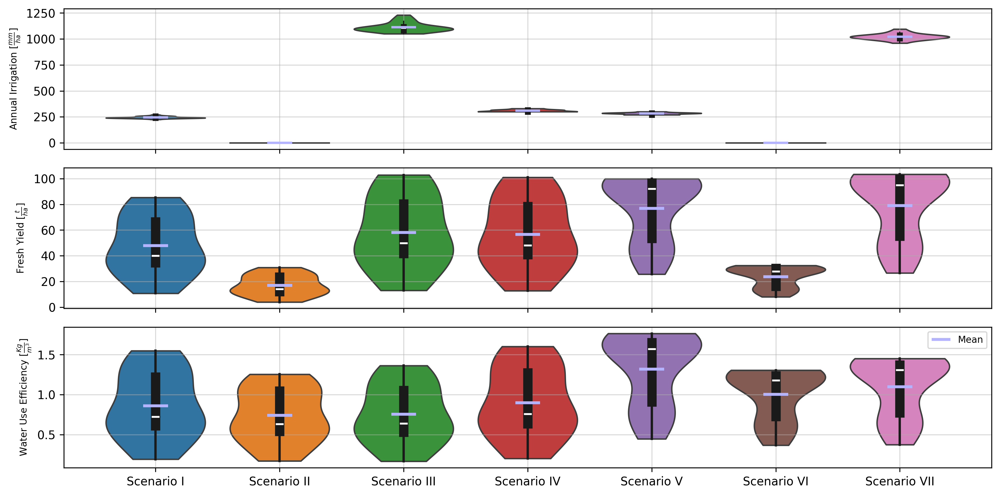

In [15]:
dpi = 300

mean_color = '#b3b3ff'
mean_widt = .1
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(12, 6), sharex=True, dpi=dpi)

sns.violinplot(data=irrigation_db, ax=ax[0], cut=0, inner_kws=dict(box_width=5, whis_width=1, color=".1"))
ax[0].set_ylabel(r'Annual Irrigation [$\frac{mm}{ha}$]', fontsize=8)
ax[0].grid(alpha=.5)
for i, scenario in enumerate(irrigation_db.columns):
    mean_value = np.mean(irrigation_db[scenario])
    ax[0].hlines(mean_value, i - mean_widt, i + mean_widt, colors=mean_color, linewidth=2, label="Mean" if i == 0 else "")

sns.violinplot(data=fresh_yield_db, ax=ax[1], cut=0, inner_kws=dict(box_width=8, whis_width=2, color=".1"))
ax[1].grid(alpha=.5)
ax[1].set_ylabel(r'Fresh Yield [$\frac{t}{ha}$]', fontsize=8)
for i, scenario in enumerate(fresh_yield_db.columns):
    mean_value = np.mean(fresh_yield_db[scenario])
    ax[1].hlines(mean_value, i - mean_widt, i + mean_widt, colors=mean_color, linewidth=2.5, label="Mean" if i == 0 else "")

sns.violinplot(data=WUE_db, ax=ax[2], cut=0, inner_kws=dict(box_width=8, whis_width=2, color=".1"))
ax[2].grid(alpha=.5)
ax[2].set_ylabel(r'Water Use Efficiency [$\frac{Kg}{m^3}$]', fontsize=8)
for i, scenario in enumerate(WUE_db.columns):
    mean_value = np.mean(WUE_db[scenario])
    ax[2].hlines(mean_value, i - mean_widt, i + mean_widt, colors=mean_color, linewidth=2.5, label="Mean" if i == 0 else "")
ax[2].legend(loc="upper right", fontsize=8)

plt.tight_layout()
plt.savefig('comprasing scenario results.png')

### Planting Days

In [11]:
station = 'Rio Copiapo En Ciudad De Copiapo'
file_name = '%s.txt'%station
dir_loc = 'C:/Users/bz267/OneDrive - University of Exeter/Documents/chile_project/Crop Modelling Rep'
file_loc = '%s/%s'%(dir_loc, file_name)
weather_df = prepare_weather(file_loc)

c_name  = 'Tomato'
planting_date = '11/15' #mm/dd 11/15 - 12/20
crop = Crop(c_name=c_name, planting_date=planting_date)
crop.HI0 = .38

soil = Soil(soil_type='SandyLoam') #'LoamySand'

initial_water_content = InitialWaterContent(value=['FC'])

# irrigation_management = IrrigationManagement(irrigation_method=1, SMT=[30]*4, AppEff=80)

field_management = FieldMngt(mulches=True, mulch_pct=100, f_mulch=0.5)

sim_start_time = '1998/10/01' #YYYY/MM/DD
sim_end_time = '2019/01/01'

In [12]:
############# OPTIMIZING SETUP FOR DIFFERENT PLANTING DATES ###############
planting_dates = plantig_date_cal(init_planting_date='12/22', num_days=9) # init_planting_date='12/01', num_days=32

pop_size = 20
iteration = 25
num_variables = 4
min_val, max_val = 0, 100
planting_dates_results = dict()

for index in range(len(planting_dates)):
    planting_date = planting_dates[index]
    crop = Crop(c_name=c_name, planting_date=planting_date)
    crop.HI0 = .38
    X, best_of, OFS, NFE = teaching_learning_based_optimization(num_variables, min_val, max_val, pop_size, iteration, obj_func)
    planting_dates_results[planting_date] = (best_of, X)
    print('[%s] \t\t\t %s planting date\tis\tDone'%(time.ctime(), planting_date))
    print('====='*17)

[Mon Mar  3 11:37:36 2025] 			 12/18 planting date	is	Done
[Mon Mar  3 12:03:59 2025] 			 12/19 planting date	is	Done
[Mon Mar  3 12:30:44 2025] 			 12/20 planting date	is	Done
[Mon Mar  3 12:57:52 2025] 			 12/21 planting date	is	Done
[Mon Mar  3 13:22:48 2025] 			 12/22 planting date	is	Done
[Mon Mar  3 13:45:08 2025] 			 12/23 planting date	is	Done
[Mon Mar  3 14:08:12 2025] 			 12/24 planting date	is	Done
[Mon Mar  3 14:30:23 2025] 			 12/25 planting date	is	Done
[Mon Mar  3 14:52:29 2025] 			 12/26 planting date	is	Done


In [13]:
############# ANALYSING SETUP FOR DIFFERENT PLANTING DATES ###############
avr_WUE_list = list()
avr_irrigation_list = list()
avr_dry_yield_list = list()
avr_fresh_yield_list = list()

for index in range(len(planting_dates)):
    planting_date = planting_dates[index]
    X = planting_dates_results[planting_date][1]
    crop = Crop(c_name=c_name, planting_date=planting_date)
    crop.HI0 = .38
    irrigation_management = IrrigationManagement(irrigation_method=1, SMT=X, AppEff=80)
    WUE_val, irrigation_val, dry_yield_val, fresh_yiled_val = brief_result_analysis(crop, soil, irrigation_management)
    avr_WUE_list.append(WUE_val)
    avr_irrigation_list.append(irrigation_val)
    avr_dry_yield_list.append(dry_yield_val)
    avr_fresh_yield_list.append(fresh_yiled_val)

In [15]:
file_name = 'planting_dates_opt_results.csv'
path_dir=r'C:\Users\bz267\OneDrive - University of Exeter\Desktop\Desalination Papers\Technical 2'

opt_date_db = pd.DataFrame({'Planting Date':[i.replace('/', '//') for i in planting_dates_results.keys()], 
                            'Optimum Varibales':[list(i[1].round(3)) for i in planting_dates_results.values()],
                            'avr. irrigation':avr_irrigation_list,
                            'avr. dry yileld':avr_dry_yield_list,
                            'avr. fresh yield':avr_fresh_yield_list, 
                            'avr. WUE':avr_WUE_list,})

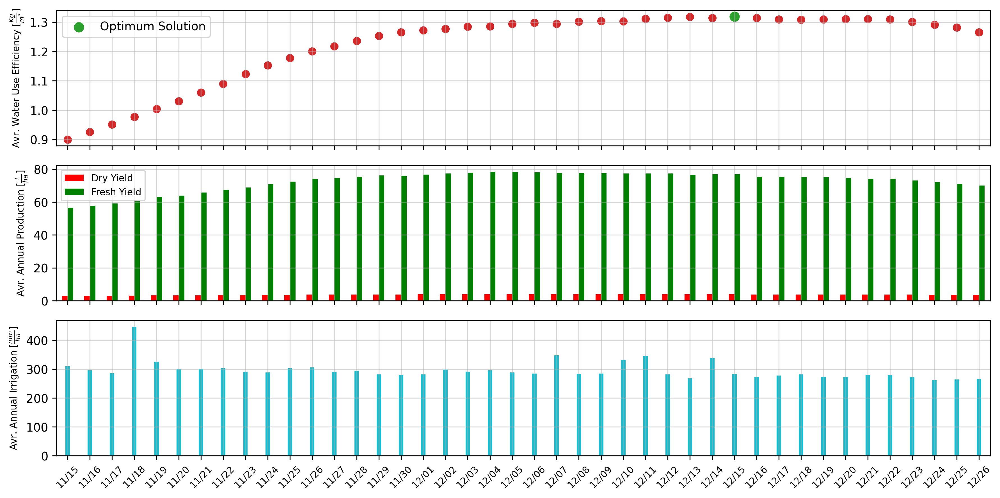

In [64]:
dpi = 300

file_name = 'planting_dates_opt_results.csv'
path_dir=r'C:\Users\bz267\OneDrive - University of Exeter\Desktop\Desalination Papers\Technical 2'
opt_date_db = pd.read_csv(Path(path_dir)/file_name)
avr_irrigation_list = opt_date_db['avr. irrigation']
avr_dry_yield_list = opt_date_db['avr. dry yileld']
avr_fresh_yield_list = opt_date_db['avr. fresh yield']
avr_WUE_list = opt_date_db['avr. WUE']
planting_dates =  opt_date_db['Planting Date']
planting_dates = [i.replace('//','/') for i in planting_dates]

optimum_sol_index = np.argmax(avr_WUE_list)
yields_db = pd.DataFrame()
yields_db['Planting Date'] = planting_dates
yields_db['Dry Yield'] = avr_dry_yield_list
yields_db['Fresh Yield'] = avr_fresh_yield_list

fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(12, 6), sharex=True, dpi=dpi)

ax[0].scatter(planting_dates, avr_WUE_list, marker='o', c='tab:red')
ax[0].scatter(planting_dates[optimum_sol_index], avr_WUE_list[optimum_sol_index], marker='o', c='tab:green', s= 60, label='Optimum Solution')
ax[0].set_ylabel(r'Avr. Water Use Efficiency [$\frac{Kg}{m^3}$]', fontsize=8)
ax[0].grid(alpha=.5)
ax[0].legend()

yields_db.plot(kind='bar', grid=True, ax=ax[1], color=['red', 'green'])
ax[1].grid(alpha=.5)
ax[1].legend(fontsize=8)
ax[1].set_ylabel(r'Avr. Annual Production [$\frac{t}{ha}$]', fontsize=8)

ax[2].bar(planting_dates, avr_irrigation_list, width=.2, color='tab:cyan' )
ax[2].grid(alpha=.5)
ax[2].set_xticklabels(planting_dates, fontsize=8, rotation=45) 
ax[2].set_ylabel(r'Avr. Annual Irrigation [$\frac{mm}{ha}$]', fontsize=8)

plt.tight_layout()
plt.savefig('planting date reults.png')

### Soil Property Sensitivity Analysis

In [151]:
station = 'Rio Copiapo En Ciudad De Copiapo'
file_name = '%s.txt'%station
dir_loc = 'C:/Users/bz267/OneDrive - University of Exeter/Documents/chile_project/Crop Modelling Rep'
file_loc = '%s/%s'%(dir_loc, file_name)
weather_df = prepare_weather(file_loc)

c_name  = 'Tomato'
planting_date = '11/15' #mm/dd 11/15 - 12/20
crop = Crop(c_name=c_name, planting_date=planting_date)
crop.HI0 = .38

soil = Soil(soil_type='SandyLoam') #'LoamySand'
soil_cn = soil.cn

initial_water_content = InitialWaterContent(value=['FC'])

SMT = np.array([30]*4)
irrigation_management = IrrigationManagement(irrigation_method=1, SMT=SMT, AppEff=80)

field_management = FieldMngt(mulches=True, mulch_pct=100, f_mulch=0.5)

sim_start_time = '1998/10/01' #YYYY/MM/DD
sim_end_time = '2019/01/01'

In [153]:
################### Sensitivity Analysis: Monte Carlo ################


num_simulations = 100
Clay_range = [15, 20] # min and max in %
Sand_range = [50, 100] # min and max in %
OrgMat_range = [0, 5] # min and max in %

avr_WUE_list = list()
avr_irrigation_list = list()
avr_dry_yield_list = list()
avr_fresh_yield_list = list()
soil_properties_list = list()
for index in range(num_simulations):
    Sand, Clay, OrgMat = soil_properties_MCMC(Clay_range=Clay_range, Sand_range=Sand_range, OrgMat_range=OrgMat_range)
    soil = Soil(soil_type='custom')
    soil.add_layer_from_texture(soil.zSoil, Sand=Sand, Clay=Clay, OrgMat=OrgMat, penetrability=100)
    soil.cn = soil_cn
    WUE_val, irrigation_val, dry_yield_val, fresh_yiled_val = brief_result_analysis(crop, soil, irrigation_management)
    avr_WUE_list.append(WUE_val)
    avr_irrigation_list.append(irrigation_val)
    avr_dry_yield_list.append(dry_yield_val)
    avr_fresh_yield_list.append(fresh_yiled_val)
    soil_properties_list.append((Sand, Clay, OrgMat))

NameError: name 'soil_properties_list' is not defined

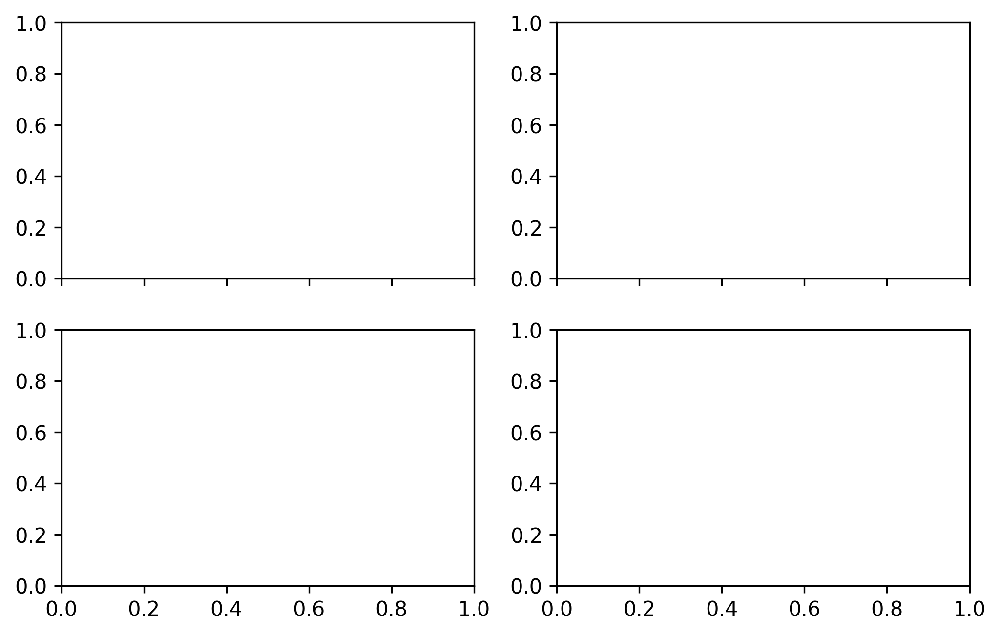

In [11]:
dpi = 300

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(8, 5), dpi=dpi, sharex=True)
ax = ax.flat
cm = plt.cm.copper(np.linspace(.2, .8, len(ax)))

soil_profile_df = pd.DataFrame()
sand_values = [i[0] for i in soil_properties_list]
clay_values = [i[1] for i in soil_properties_list]
orgMat_values = [i[2] for i in soil_properties_list]
soil_profile_df['Organic Matter [%]'] = orgMat_values
soil_profile_df['Clay [%]'] = clay_values
soil_profile_df['Sand [%]'] = sand_values
soil_profile_df['Silt [%]'] = 100 - soil_profile_df.sum(axis=1)

for index, column_name in enumerate(soil_profile_df):
    sns.violinplot(y=soil_profile_df[column_name], ax=ax[index], color=cm[index],) 
    ax[index].set_ylabel('%s'%column_name, fontsize=8)
    ax[index].grid(alpha=.5, axis='y')
    
plt.tight_layout()

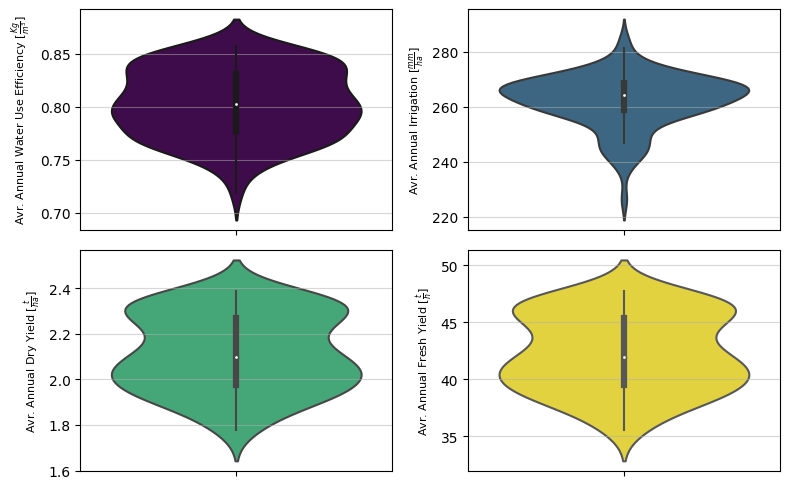

In [161]:
dpi=100

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(8, 5), dpi=dpi, sharex=True)
ax = ax.flat
cm = plt.cm.viridis(np.linspace(0, 1, len(ax)))
                    
sns.violinplot(y=avr_WUE_list, ax=ax[0], color=cm[0])
ax[0].set_ylabel(r'Avr. Annual Water Use Efficiency $[\frac{Kg}{m^3}]$', fontsize=8)
ax[0].grid(alpha=.5, axis='y')

sns.violinplot(y=avr_irrigation_list, ax=ax[1], color=cm[1])
ax[1].set_ylabel(r'Avr. Annual Irrigation $[\frac{mm}{ha}]$', fontsize=8)
ax[1].grid(alpha=.5, axis='y')
                    
sns.violinplot(y=avr_dry_yield_list, ax=ax[2], color=cm[2])
ax[2].set_ylabel(r'Avr. Annual Dry Yield $[\frac{t}{ha}]$', fontsize=8)
ax[2].grid(alpha=.5, axis='y')
                    
sns.violinplot(y=avr_fresh_yield_list, ax=ax[3], color=cm[3])
ax[3].set_ylabel(r'Avr. Annual Fresh Yield $[\frac{t}{h}]$', fontsize=8)
ax[3].grid(alpha=.5, axis='y')

plt.tight_layout()

In [171]:
file_name = 'soil_sensitivity_analysis.csv'
path_dir=r'C:\Users\bz267\OneDrive - University of Exeter\Desktop\Desalination Papers\Technical 2'

soil_sens_analysis_db = pd.DataFrame({'Sand [%]':sand_values, 'Clay [%]':clay_values, 'Organic Matter [%]': orgMat_values,
                                      'avr. irrigation':avr_irrigation_list,
                                      'avr. dry yileld':avr_dry_yield_list,
                                      'avr. fresh yield':avr_fresh_yiled_list, 
                                      'avr. WUE':avr_WUE_list,})
soil_sens_analysis_db.to_csv(Path(path_dir)/file_name)

In [11]:
file_name = 'soil_sensitivity_analysis.csv'
path_dir=r'C:\Users\bz267\OneDrive - University of Exeter\Desktop\Desalination Papers\Technical 2'

soil_df = pd.read_csv(Path(path_dir)/file_name, index_col=0)
soil_df.head()

,Sand [%],Clay [%],Organic Matter [%],avr. irrigation,avr. dry yileld,avr. fresh yield,avr. WUE
0,83.549,10.614,4.940,267.75,2.127,42.535,0.809
1,74.030,16.684,0.082,268.50,2.099,41.973,0.803
2,87.689,9.814,1.656,261.75,1.845,36.907,0.754
3,88.170,7.718,3.410,273.75,2.027,40.544,0.788
4,82.635,15.172,0.339,255.00,1.799,35.987,0.744


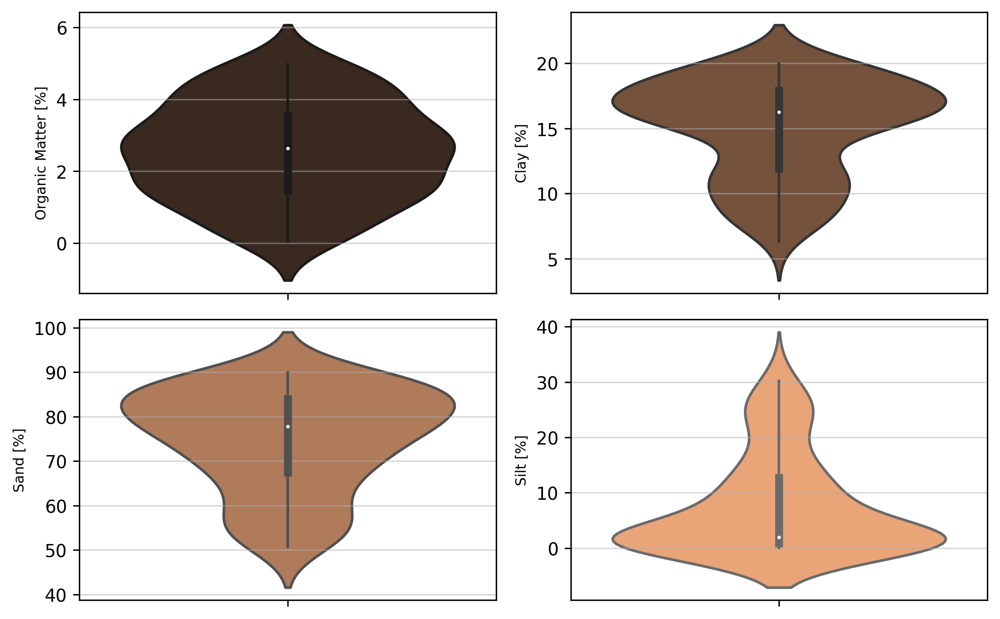

In [12]:
dpi = 300

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(8, 5), dpi=dpi, sharex=True)
ax = ax.flat
cm = plt.cm.copper(np.linspace(.2, .8, len(ax)))

soil_profile_df = pd.DataFrame()
sand_values = soil_df['Sand [%]']
clay_values = soil_df['Clay [%]']
orgMat_values = soil_df['Organic Matter [%]']
soil_profile_df['Organic Matter [%]'] = orgMat_values
soil_profile_df['Clay [%]'] = clay_values
soil_profile_df['Sand [%]'] = sand_values
soil_profile_df['Silt [%]'] = 100 - soil_profile_df.sum(axis=1)

for index, column_name in enumerate(soil_profile_df):
    sns.violinplot(y=soil_profile_df[column_name], ax=ax[index], color=cm[index],) 
    ax[index].set_ylabel('%s'%column_name, fontsize=8)
    ax[index].grid(alpha=.5, axis='y')
    
plt.tight_layout()
plt.savefig('soil_prop.png')

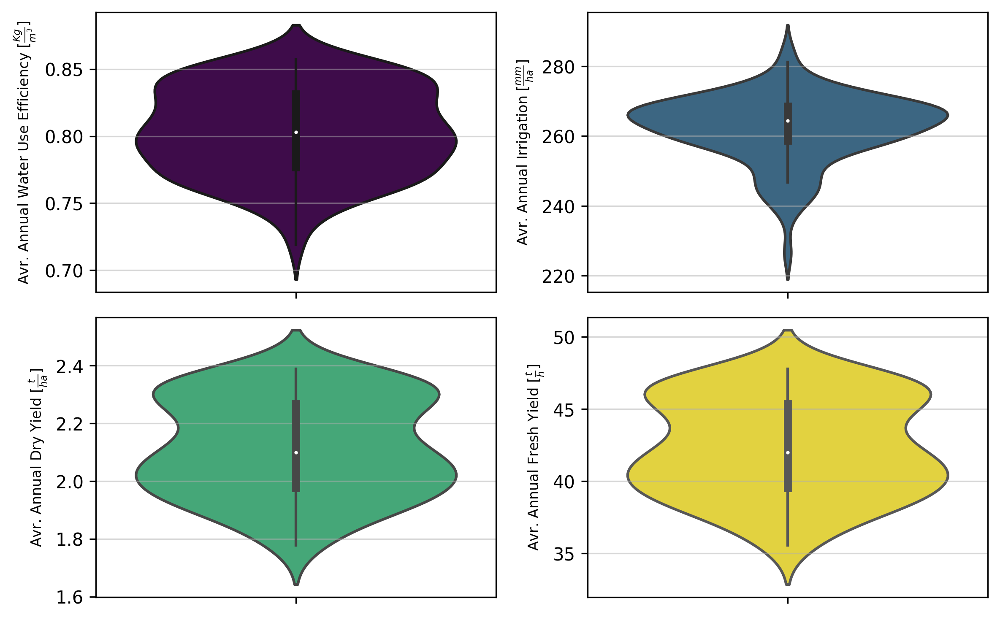

In [19]:
dpi = 300

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(8, 5), dpi=dpi, sharex=True)
ax = ax.flat
cm = plt.cm.viridis(np.linspace(0, 1, len(ax)))
                    
sns.violinplot(y=soil_df['avr. WUE'], ax=ax[0], color=cm[0])
ax[0].set_ylabel(r'Avr. Annual Water Use Efficiency $[\frac{Kg}{m^3}]$', fontsize=8)
ax[0].grid(alpha=.5, axis='y')

sns.violinplot(y=soil_df['avr. irrigation'], ax=ax[1], color=cm[1])
ax[1].set_ylabel(r'Avr. Annual Irrigation $[\frac{mm}{ha}]$', fontsize=8)
ax[1].grid(alpha=.5, axis='y')
                    
sns.violinplot(y=soil_df['avr. dry yileld'], ax=ax[2], color=cm[2])
ax[2].set_ylabel(r'Avr. Annual Dry Yield $[\frac{t}{ha}]$', fontsize=8)
ax[2].grid(alpha=.5, axis='y')
                    
sns.violinplot(y=soil_df['avr. fresh yield'], ax=ax[3], color=cm[3])
ax[3].set_ylabel(r'Avr. Annual Fresh Yield $[\frac{t}{h}]$', fontsize=8)
ax[3].grid(alpha=.5, axis='y')

plt.tight_layout()
plt.savefig('soil_sensitivity_analysis.png')

In [22]:
soil_df[['avr. irrigation', 'avr. fresh yield', 'avr. WUE']].describe()

,avr. irrigation,avr. fresh yield,avr. WUE
count,100.00000,100.000000,100.000000
mean,262.27500,42.337770,0.803470
std,9.51285,3.379876,0.032385
min,226.50000,35.546000,0.719000
25%,258.75000,39.523500,0.776750
50%,264.37500,41.988000,0.803000
75%,268.50000,45.345000,0.831250
max,284.25000,47.788000,0.857000


### Diffrent Obj. Function

In [10]:
station = 'Rio Copiapo En Ciudad De Copiapo'
file_name = '%s.txt'%station
dir_loc = 'C:/Users/bz267/OneDrive - University of Exeter/Documents/chile_project/Crop Modelling Rep'
file_loc = '%s/%s'%(dir_loc, file_name)
weather_df = prepare_weather(file_loc)

c_name  = 'Tomato'
planting_date = '11/15' #mm/dd 11/15 - 12/20
crop = Crop(c_name=c_name, planting_date=planting_date)
crop.HI0 = .38

soil = Soil(soil_type='SandyLoam') #'LoamySand'

initial_water_content = InitialWaterContent(value=['FC'])

irrigation_management = IrrigationManagement(irrigation_method=1, SMT=[30]*4, AppEff=80)

field_management = FieldMngt(mulches=True, mulch_pct=100, f_mulch=0.5)

sim_start_time = '1998/10/01' #YYYY/MM/DD
sim_end_time = '2019/01/01'

In [11]:
model = AquaCropModel(sim_start_time, sim_end_time,
                      weather_df=weather_df,
                      crop=crop,
                      initial_water_content=initial_water_content,
                      soil=soil,
                      irrigation_management=irrigation_management,
                      field_management=field_management)
model.run_model(till_termination=True)

True

In [33]:
def obj_func_2(X):
    # Based on Fresh Yield and Irrigation
    irrigation_management = IrrigationManagement(irrigation_method=1, SMT=X, AppEff=80)
    model = AquaCropModel(sim_start_time=sim_start_time,
                          sim_end_time=sim_end_time,
                          weather_df=weather_df,
                          crop=crop,
                          initial_water_content=initial_water_content,
                          soil=soil,
                          irrigation_management=irrigation_management,
                          field_management=field_management)
    model.run_model(till_termination=True)
    mean_fy = model._outputs.final_stats['Fresh yield (tonne/ha)'].mean()
    mean_ir = model._outputs.final_stats['Seasonal irrigation (mm)'].mean()
    of = -(mean_fy/mean_ir)
    return of

In [34]:
X = np.array([30]*4)

obj_func(X), obj_func_2(X)

(-0.8618554794816962, -0.19548745676727486)

In [35]:
station = 'Rio Copiapo En Ciudad De Copiapo'
file_name = '%s.txt'%station
dir_loc = 'C:/Users/bz267/OneDrive - University of Exeter/Documents/chile_project/Crop Modelling Rep'
file_loc = '%s/%s'%(dir_loc, file_name)
weather_df = prepare_weather(file_loc)

c_name  = 'Tomato'
planting_date = '11/15' #mm/dd 11/15 - 12/20
crop = Crop(c_name=c_name, planting_date=planting_date)
crop.HI0 = .38

soil = Soil(soil_type='SandyLoam') #'LoamySand'

initial_water_content = InitialWaterContent(value=['FC'])

#irrigation_management = IrrigationManagement(irrigation_method=1, SMT=[30]*4, AppEff=80)

field_management = FieldMngt(mulches=True, mulch_pct=100, f_mulch=0.5)

sim_start_time = '1998/10/01' #YYYY/MM/DD
sim_end_time = '2019/01/01'

In [36]:
min_val, max_val = 0, 100
num_variables = 4

pop_size = 20
iteration = 25

In [37]:
start_time = time.time()

X, best_of, OFS, NFE = teaching_learning_based_optimization(num_variables, min_val, max_val, pop_size, iteration, obj_func_2)

end_time = time.time()
minute = (end_time-start_time)//60
second = (end_time-start_time)-60*minute
print('Best OF', '='*20)
print(best_of)
print('Variables', '='*18)
print(X)
print('Time', '='*22)
print('Time: %d min and %.2f s'%(minute, second))

Best OF ====================
-inf
Variables ==================
[19.4803268   7.03400658  0.          0.        ]
Time ======================
Time: 32 min and 35.45 s


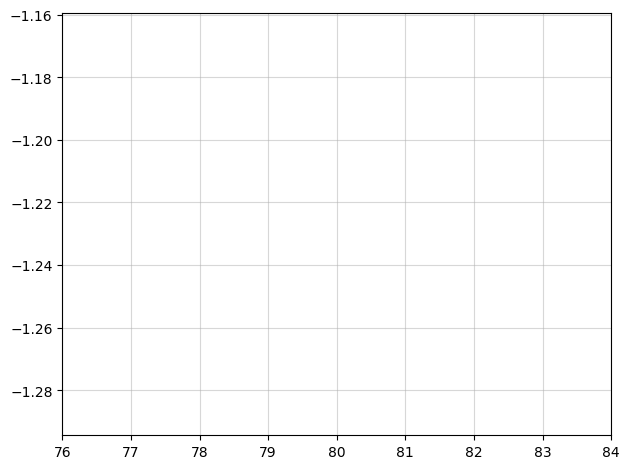

In [39]:
fig = plt.plot(NFE, OFS)
fig = plt.grid(alpha=.5)
fig = plt.margins(0,.05)
fig = plt.axhline(best_of, ls='--', alpha=.5, c='r')
plt.tight_layout()